# Customer Segmentation Analysis for Marketing Campaigns

## 1. Introduction and Dataset Research

### Motivation

<font color='blue'>

In this analysis, we will explore a dataset of customers for a retail firm and their relevant attributes. The dataset contains details of 2240 customers who have made at least one purchase from the retail firm from August 2012 to December 2014. The dataset contains different kinds of information regarding each customer. These could be broadly classified as 
* Customer Personal Information- Info. like the customer's age, income, number of children etc.
* Customer Spend Behaviour - On which products the customer spends the most 
* Customer Response to Deals and Promotions - Whether a customer bought an item through a promotion or a deal
* Channel of Purchase - Which channel the customer used to purchase the product

**Purpose of the Analysis** 

The main purpose of this analysis of customer information is to get an understanding of customer purchase behaviour and their response to various marketing campaigns. We can break down the list of customers into groups or segments and create marketing campaigns targetted towards customers belonging to a particular segment. Essentially, the content of the marketing campaign can be customised to appeal to different types of customers; targeting the prime audience and maximising the ROI from marketing.

**Research Goals**

We have the following research goals in this analysis: 
1. Identify "main clusters" or segments  of customers for the retail firm.
2. Identify the major channels of purchase of each cluster to maximize growth.
3. We would like to know what are the most dissimilar groups of customers and what makes them dissimilar . 
4. Finally, we would like to know what are the customer attributes that characterise each cluster 

***Resources***
* **1**. Tama-Rutgliano,Karina,`"Prioritize Your Customer Segmentation In Digital Marketing Campaigns"`,*https://www.forbes.com/sites/forbescommunicationscouncil/2019/07/22/prioritize-your-customer-segmentation-in-digital-marketing-campaigns/?sh=7ea920122ee3*
* **2**.Mialki,Stephanie,`"The Power of Market Segmentation & Why All Your Campaigns Need It"`,*https://instapage.com/blog/market-segmentation*
* **3**. Shahenaj,Begam,`"Customer Profiling and Segmentation – An Analytical Approach To Business Strategy In Retail Banking"`,*https://www.analyticsvidhya.com/blog/2021/03/customer-profiling-and-segmentation-an-analytical-approach-to-business-strategy-in-retail-banking/*

</font>

### Dataset Description

<font color='blue'>

The dataset was collected from Kaggle : https://www.kaggle.com/rodsaldanha/arketing-campaign

Below is a brief description of the 29 features of the dataset.

**ID:** the unique identification code for every customer <br>
**Year_Birth:** The Year of a customer's birth <br>
**Education:** The level of education that a customer completed <br>
**Marital_Status:** Status of Marriage <br>
**Income:** Annual Income <br>
**Kidhome:** No. of children under the age of 13 in Customer's household<br>
**Teenhome:** No. of children between 13-19 in Customer's household<br>
**Dt_Customer:** Date of Customer Enrollment<br>
**Recency:** No. of days since last purchase<br>
**MntWines:** Dollar amount of Wines purchased in last 2 years<br>
**MntFruits:** Dollar amount of Fruits purchased in last 2 years<br>
**MntMeatProducts:** Dollar amount of Meat products purchased in the last 2 years<br>
**MntFishProducts:** Dollar amount of Fish products purchased in the last 2 years<br>
**MntSweetProducts:** Dollar amount of Sweet products purchased in the last 2 years<br>
**MntGoldProds:** Dollar amount of Gold products purchased in the last 2 years<br>
**NumDealsPurchases:** No. of purchases made with discount<br>
**NumWebPurchases:** No. of purchases made through the company's website<br>
**NumCatalogPurchases:** # of purchases made using the catalog<br>
**NumStorePurchases:** No. of purchases made directly in-store<br>
**NumWebVisitsMonth:** No. of visits made through company's website<br>
**AcceptedCmp1:** 1 if customer accepted the offer in the 1st campaign, 0 otherwise<br>
**AcceptedCmp2:** 1 if customer accepted the offer in the 2nd campaign, 0 otherwise<br>
**AcceptedCmp3:** 1 if customer accepted the offer in the 3rd campaign, 0 otherwise<br>
**AcceptedCmp4:** 1 if customer accepted the offer in the 4th campaign, 0 otherwise<br>
**AcceptedCmp5:** 1 if customer accepted the offer in the 5th campaign, 0 otherwise<br>
**Complain:** 1 if customer complained in the last 2 years, 0 otherwise<br>
**Response:** 1 if customer accepted the offer in the last campaign, 0 otherwise<br>


</font>

## 2. Data Cleaning and Manipulation

<font color='blue'>

Let us import the required libraries which could be useful for our analysis


</font>

In [108]:
import numpy as np
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

from sklearn.cluster import KMeans

from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import silhouette_samples
from sklearn.metrics import calinski_harabasz_score

from sklearn.metrics import silhouette_samples, silhouette_score

from sklearn.preprocessing import StandardScaler

from pyclustertend import hopkins

from sklearn.manifold import TSNE

from sklearn.metrics import homogeneity_score, completeness_score, v_measure_score

from scipy.spatial.distance import pdist, squareform

from skfuzzy.cluster import cmeans

from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN

from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, dendrogram, cophenet

from sklearn.decomposition import PCA

from gower import gower_matrix
from numpy import isnan

from sklearn.impute import KNNImputer
import random

from sklearn.mixture import GaussianMixture


<font color='blue'>

We will  read the data as a dataframe for further analysis.
</font>

In [2]:
df=pd.read_csv('marketing_campaign.csv',delimiter='\t')
df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


<font color='blue'>

**Checking missing values in the dataset**

</font>

In [3]:
(df.isnull().sum()*100)/df.shape[0]

ID                     0.000000
Year_Birth             0.000000
Education              0.000000
Marital_Status         0.000000
Income                 1.071429
Kidhome                0.000000
Teenhome               0.000000
Dt_Customer            0.000000
Recency                0.000000
MntWines               0.000000
MntFruits              0.000000
MntMeatProducts        0.000000
MntFishProducts        0.000000
MntSweetProducts       0.000000
MntGoldProds           0.000000
NumDealsPurchases      0.000000
NumWebPurchases        0.000000
NumCatalogPurchases    0.000000
NumStorePurchases      0.000000
NumWebVisitsMonth      0.000000
AcceptedCmp3           0.000000
AcceptedCmp4           0.000000
AcceptedCmp5           0.000000
AcceptedCmp1           0.000000
AcceptedCmp2           0.000000
Complain               0.000000
Z_CostContact          0.000000
Z_Revenue              0.000000
Response               0.000000
dtype: float64

<font color='blue'>

We observe that `Income` variable has around 1% missing values in the dataset. To remedy this, We should not delete the rows with missing values because that  might result in loss of relevant customers or delete the entire column which may lead to loss of relevant customer information. So, we should find a way to replace the missing values with relevant datapoints so that our dataset is complete. One way to do that is through imputation of missing income values with KNN Imputer. In the code below, we have used the KNN Imputer to replace the missing values using the Year of birth, Number of Kids as predictors.
</font>

In [4]:
imputer = KNNImputer()
imputer = KNNImputer(n_neighbors=5,metric='nan_euclidean')
# fit on the dataset
imputer.fit(df[['Income','Year_Birth','Kidhome','Teenhome']])
# transform the dataset
Y = imputer.transform(df[['Income','Year_Birth','Kidhome','Teenhome']])
Income_impute=pd.DataFrame(Y,columns=['Income','Year_Birth','Kidhome','Teenhome'])
df['Income']=Income_impute['Income'].reset_index(drop=True)
(df.isnull().sum()*100)/df.shape[0]

ID                     0.0
Year_Birth             0.0
Education              0.0
Marital_Status         0.0
Income                 0.0
Kidhome                0.0
Teenhome               0.0
Dt_Customer            0.0
Recency                0.0
MntWines               0.0
MntFruits              0.0
MntMeatProducts        0.0
MntFishProducts        0.0
MntSweetProducts       0.0
MntGoldProds           0.0
NumDealsPurchases      0.0
NumWebPurchases        0.0
NumCatalogPurchases    0.0
NumStorePurchases      0.0
NumWebVisitsMonth      0.0
AcceptedCmp3           0.0
AcceptedCmp4           0.0
AcceptedCmp5           0.0
AcceptedCmp1           0.0
AcceptedCmp2           0.0
Complain               0.0
Z_CostContact          0.0
Z_Revenue              0.0
Response               0.0
dtype: float64

<font color='blue'>

So as we can see the missing values have been removed. Now let's look at the `Dt_Customer` column. We can see that the column has the date when the customer enrolled with the firm. Assuming that the latest date in the dataset is the most recent transaction and also assuming that there are no customers who have churned out,  we can derive a new column called `Customer_For` which basically indicates the number of days the customer is part of the company.

</font>

In [5]:
df["Dt_Customer"] = pd.to_datetime(df["Dt_Customer"])
dates = []
for i in df["Dt_Customer"]:
    i = i.date()
    dates.append(i)  
#Dates of the newest and oldest recorded customer
print("The newest customer's enrolment date in therecords:",max(dates))
print("The oldest customer's enrolment date in the records:",min(dates))

The newest customer's enrolment date in therecords: 2014-12-06
The oldest customer's enrolment date in the records: 2012-01-08


<font color ='blue'>  As can be observed,the newest customer's enrolment date is 6th December 2014. So we would be using this to calculate `Customer_For` field.  </font>

In [6]:
#Created a feature "Customer_For"
days = []
d1 = max(dates) #taking it to be the newest customer
for i in dates:
    delta = d1 - i
    days.append(delta.days)
df["Customer_For"] = days
df["Customer_For"] = pd.to_numeric(df["Customer_For"], errors="coerce")

<font color ='blue'> We have two categorical variables in the dataset. `Education` and `Marital_status`. Let's explore these fields and get their distinct values. In the process, we would like to 'simplify' some fields for ease of interpretation before proceeding with clustering. </font>

In [7]:
df['Education'].value_counts()

Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: Education, dtype: int64

In [8]:
df['Marital_Status'].value_counts()

Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: Marital_Status, dtype: int64

<font color ='blue'>  **Feature Engineering**   </font>

<font color='blue'>

* 1. We can combine education levels to Graduate and Undergraduate.
* 2. Similarly using Marital Status, we can derive an new column called `Living_With` to see whether a customer is living alone or with a partner. 
* 3. We can also create a new feature called `Family Size` to see the number of people in the family (along with kids). 
* 4. We can add the `KidHome` and `TeenHome` features to get the total number of `Children` in the house. 
* 5. Based on the count of children, we can create a feature called `IsParent` or not. 
* 6. We can drop redundant variables like `ID`,`DtCustomer` etc. which don't add any further info to the dataset.
* 7. We can add another column `Spend` which gives us the total amount spent by the customer on different categories.

</font>

In [9]:
#Feature Engineering
#Age of customer today 
df["Age"] = 2021-df["Year_Birth"]

#Total spendings on various items
df["Spent"] = df["MntWines"]+ df["MntFruits"]+ df["MntMeatProducts"]+ df["MntFishProducts"]+ df["MntSweetProducts"]+ df["MntGoldProds"]

#Deriving living situation by marital status"Alone"
df["Living_With"]=df["Marital_Status"].replace({"Married":"Partner", "Together":"Partner", "Absurd":"Alone", "Widow":"Alone", "YOLO":"Alone", "Divorced":"Alone", "Single":"Alone"})

#Feature indicating total children living in the household
df["Children"]=df["Kidhome"]+df["Teenhome"]

#Feature for total members in the householde
df["Family_Size"] = df["Living_With"].replace({"Alone": 1, "Partner":2})+ df["Children"]

#Feature pertaining parenthood
df["Is_Parent"] = np.where(df.Children> 0, 'Yes', 'No')

#Segmenting education levels in three groups
df["Education"]=df["Education"].replace({"Basic":"Undergraduate","2n Cycle":"Undergraduate", "Graduation":"Graduate", "Master":"Postgraduate", "PhD":"Postgraduate"})

#For clarity
df=df.rename(columns={"MntWines": "Wines","MntFruits":"Fruits","MntMeatProducts":"Meat","MntFishProducts":"Fish","MntSweetProducts":"Sweets","MntGoldProds":"Gold"})

#Dropping some of the redundant features
to_drop = ["Marital_Status", "Dt_Customer", "Z_CostContact", "Z_Revenue", "Year_Birth", "ID"]
df = df.drop(to_drop, axis=1)


In [10]:
df.head()

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,...,AcceptedCmp2,Complain,Response,Customer_For,Age,Spent,Living_With,Children,Family_Size,Is_Parent
0,Graduate,58138.0,0,0,58,635,88,546,172,88,...,0,0,1,971,64,1617,Alone,0,1,No
1,Graduate,46344.0,1,1,38,11,1,6,2,1,...,0,0,0,125,67,27,Alone,2,3,Yes
2,Graduate,71613.0,0,0,26,426,49,127,111,21,...,0,0,0,472,56,776,Partner,0,2,No
3,Graduate,26646.0,1,0,26,11,4,20,10,3,...,0,0,0,65,37,53,Partner,1,3,Yes
4,Postgraduate,58293.0,1,0,94,173,43,118,46,27,...,0,0,0,321,40,422,Partner,1,3,Yes


## 3. Basic Descriptive Analytics

<font color='blue'>

Let's look at the basic descriptive statistics of our dataset.



</font>

In [11]:
df.shape

(2240, 30)

In [12]:
df.describe()

,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Customer_For,Age,Spent,Children,Family_Size
count,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000
mean,52190.060179,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,...,0.072768,0.064286,0.013393,0.009375,0.149107,512.043304,52.194196,605.798214,0.950446,2.595089
std,25079.388552,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,...,0.259813,0.245316,0.114976,0.096391,0.356274,232.229893,11.984069,602.249288,0.751803,0.906959
min,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,25.000000,5.000000,0.000000,1.000000
25%,35376.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,340.750000,44.000000,68.750000,0.000000,2.000000
50%,51342.000000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,513.000000,51.000000,396.000000,1.000000,3.000000
75%,68325.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,685.250000,62.000000,1045.500000,1.000000,3.000000
max,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1063.000000,128.000000,2525.000000,3.000000,5.000000


<font color='blue'>
    
From the above table we can form a numerical summary about our variables. <br>
The average annual **income** of a customer is 51687 . <br>
On average the customers it has been 49 days since the last purchase(**Recency**). <br> 
The most amount spent is on wines 303 USD (avg) in the past 2 years. <br>
The next highest amount spent is on **Meat**, 166.9 USD (avg) <br>
Average amount spent on Fruits is 26.3 USD, 37.5 USD on **Fish** and 27.06 USD on Sweets. <br>
Customers on average spend 44 USD on buying **Gold** products. <br>

Some variables like `Income` have a much higher standard deviation than others and might influence the results of our distance based clustering algorithm. So we might need to scale the numerical columns later on. Additionally, the max value of income is much higher than the mean and might possibly be an outlier. We can remove it before proceeeding with our analysis as a very high income customer's purchasing behaviour may not lead us to relevant insights for targeting other customers. This might end up being a singleton cluster.

</font>

<font color='blue'>

**Outlier Removal**


</font>

In [13]:
df = df.drop(df[df['Income']> 600000].index).reset_index(drop=True)
df.describe()

,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Customer_For,Age,Spent,Children,Family_Size
count,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,...,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000
mean,51915.618044,0.443948,0.506476,49.121036,304.067441,26.307727,167.016525,37.538633,27.074587,44.036177,...,0.072800,0.064314,0.013399,0.009379,0.149174,511.973649,52.197856,606.041090,0.950424,2.594908
std,21458.517675,0.538390,0.544555,28.963662,336.614830,39.781468,225.743829,54.637617,41.286043,52.174700,...,0.259867,0.245367,0.115001,0.096412,0.356339,232.258365,11.985494,602.274089,0.751970,0.907122
min,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,25.000000,5.000000,0.000000,1.000000
25%,35364.000000,0.000000,0.000000,24.000000,24.000000,1.000000,16.000000,3.000000,1.000000,9.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,340.500000,44.000000,69.000000,0.000000,2.000000
50%,51315.000000,0.000000,0.000000,49.000000,174.000000,8.000000,67.000000,12.000000,8.000000,24.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,513.000000,51.000000,396.000000,1.000000,3.000000
75%,68298.500000,1.000000,1.000000,74.000000,504.500000,33.000000,232.000000,50.000000,33.000000,56.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,685.500000,62.000000,1046.000000,1.000000,3.000000
max,162397.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1063.000000,128.000000,2525.000000,3.000000,5.000000


<font color ='blue'> 

**Data  Exploration**

<font color='blue'>

Let's look at how many variables are numerical and how many are categorical.

</font>

In [14]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
cat=['object']
bool=['bool']
num_col = df.select_dtypes(include=numerics).columns.tolist()
cat_col=df.select_dtypes(include=cat).columns.tolist()

print('There are %s Numerical Columns ' % (str(len(num_col))) )
print(num_col)
print('-------------------')
print('There are %s Categorical Columns ' % (str(len(cat_col))) )
print(cat_col)

There are 27 Numerical Columns 
['Income', 'Kidhome', 'Teenhome', 'Recency', 'Wines', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Response', 'Customer_For', 'Age', 'Spent', 'Children', 'Family_Size']
-------------------
There are 3 Categorical Columns 
['Education', 'Living_With', 'Is_Parent']


<font color ='blue'> 

So we can observe that there are 27 Numerical columns and 3 Categorical columns in our dataset.

<AxesSubplot:xlabel='Education', ylabel='count'>

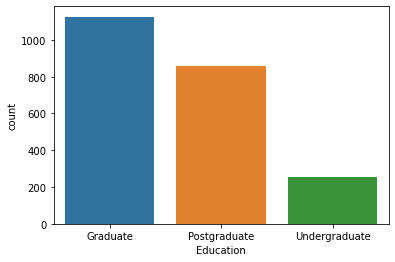

In [15]:
 sns.countplot(x="Education", data=df)

<font color ='blue'> 
The above histogram tells us about the Education status of the customers that around 1100 customers are Graduate, 800 Postgraduate and 250 are Undergraduate. 

<AxesSubplot:xlabel='Living_With', ylabel='count'>

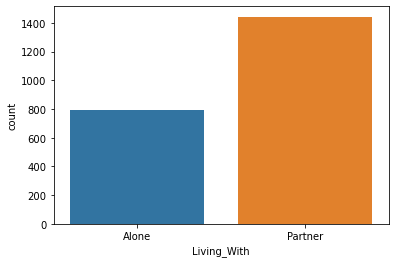

In [16]:
 sns.countplot(x="Living_With", data=df)

<font color ='blue'> 

The above histogram shows that around 800 customers are living alone and around 1400 customers are having a partner.

<AxesSubplot:xlabel='Is_Parent', ylabel='count'>

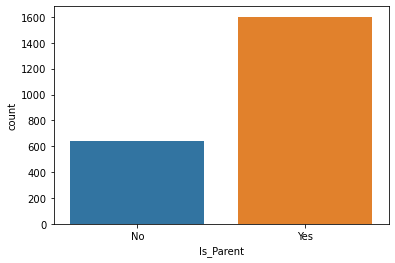

In [17]:
 sns.countplot(x="Is_Parent", data=df)

<font color ='blue'> 
    
This histogram tells us that 1600 customers are parents and around 600 customers are not parents. 

<font color ='blue'> 
We do a pairwise plot for some of the features to get a better understanding of our dataset. <br>

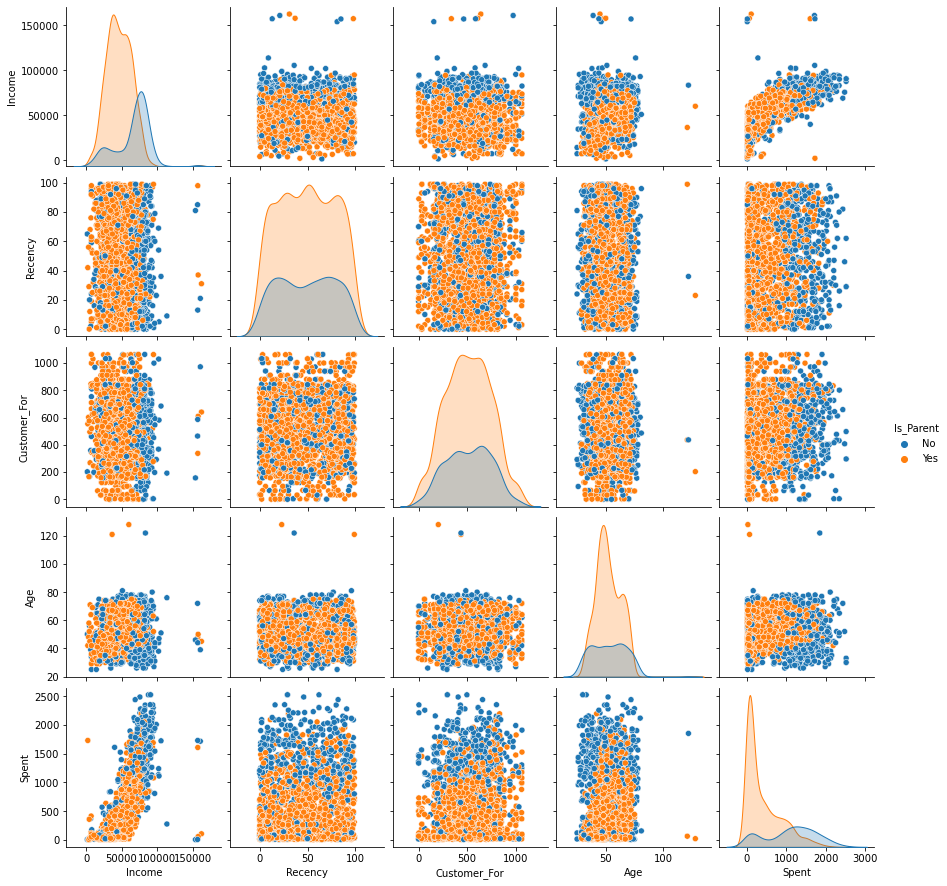

In [18]:
temp = [ "Income", "Recency", "Customer_For", "Age", "Spent", "Is_Parent"]
sns.pairplot(df[temp], hue= "Is_Parent")

<font color='blue'>

From the above pairwise plots we find that there are some outliers in our dataset. But we would like to keep those outliers as they might prove to be relevant when understanding customer behaviour <br> 
There are a few observations we can make : <br>
Customers who are parents have higher income and also spend more. <br>
Customers who are parents have older than the customers who aren't. <br>
There is a somewhat linear relationship between income and amount spent. <br>
The customers who are parents have been **Customer_For** much longer than the customers who are not parents. <br> 

</font>

<font color='blue'>
    
Let's explore the features which are  response to promotions and deals

<AxesSubplot:xlabel='AcceptedCmp1', ylabel='count'>

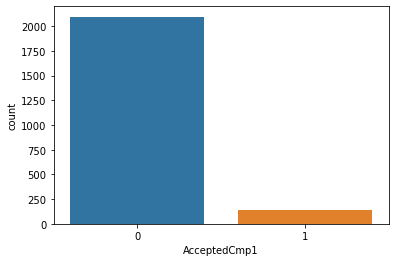

In [19]:
 sns.countplot(x="AcceptedCmp1", data=df)

<AxesSubplot:xlabel='AcceptedCmp2', ylabel='count'>

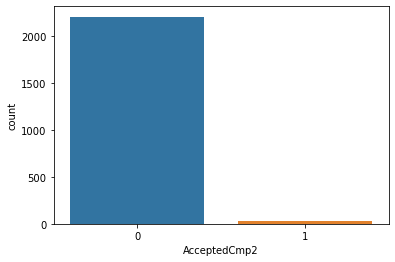

In [20]:
 sns.countplot(x="AcceptedCmp2", data=df)

<AxesSubplot:xlabel='AcceptedCmp3', ylabel='count'>

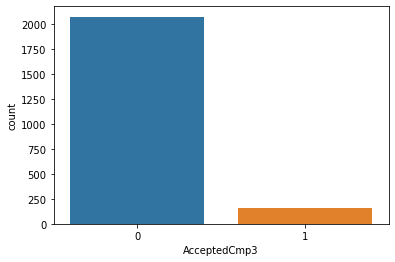

In [21]:
 sns.countplot(x="AcceptedCmp3", data=df)

<AxesSubplot:xlabel='AcceptedCmp4', ylabel='count'>

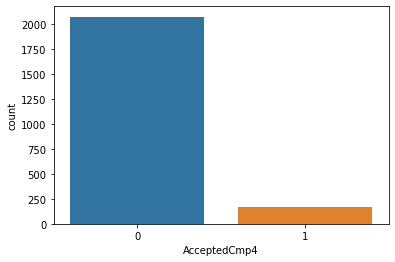

In [22]:
 sns.countplot(x="AcceptedCmp4", data=df)

<AxesSubplot:xlabel='AcceptedCmp5', ylabel='count'>

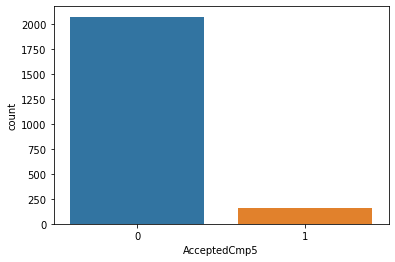

In [23]:
 sns.countplot(x="AcceptedCmp5", data=df)

<AxesSubplot:xlabel='Response', ylabel='count'>

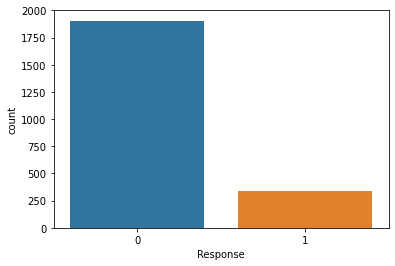

In [24]:
 sns.countplot(x="Response", data=df)

<font color='blue'>
    
By looking at the above histograms we find that among all the campaigns, campaign 2 was the least successful, <br>
as the least amount of customers accepted the offer amongst the other campaigns.  

## 4. Dataset Scaling Decisions

In [25]:
df.describe()

,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Customer_For,Age,Spent,Children,Family_Size
count,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,...,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000,2239.000000
mean,51915.618044,0.443948,0.506476,49.121036,304.067441,26.307727,167.016525,37.538633,27.074587,44.036177,...,0.072800,0.064314,0.013399,0.009379,0.149174,511.973649,52.197856,606.041090,0.950424,2.594908
std,21458.517675,0.538390,0.544555,28.963662,336.614830,39.781468,225.743829,54.637617,41.286043,52.174700,...,0.259867,0.245367,0.115001,0.096412,0.356339,232.258365,11.985494,602.274089,0.751970,0.907122
min,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,25.000000,5.000000,0.000000,1.000000
25%,35364.000000,0.000000,0.000000,24.000000,24.000000,1.000000,16.000000,3.000000,1.000000,9.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,340.500000,44.000000,69.000000,0.000000,2.000000
50%,51315.000000,0.000000,0.000000,49.000000,174.000000,8.000000,67.000000,12.000000,8.000000,24.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,513.000000,51.000000,396.000000,1.000000,3.000000
75%,68298.500000,1.000000,1.000000,74.000000,504.500000,33.000000,232.000000,50.000000,33.000000,56.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,685.500000,62.000000,1046.000000,1.000000,3.000000
max,162397.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1063.000000,128.000000,2525.000000,3.000000,5.000000


<font color='blue'>

As explained above, some variables like Income has a much higher standard deviation than others. So if plan to use algorithms like k-means , then we need to scale the numerical columns in our dataset so that the variables like Income doesn't influence the results of our clustering exercise.

In [26]:
df_num=df[num_col]
df_cat=df[cat_col]


scale=StandardScaler()
scaled_arr=scale.fit_transform(df_num)

In [27]:
df_num_scaled=pd.DataFrame(scaled_arr,columns=df_num.columns)
df_num_scaled.head()

,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,...,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Customer_For,Age,Spent,Children,Family_Size
0,0.290037,-0.824769,-0.930282,0.306624,0.983339,1.551126,1.679196,2.461517,1.476020,0.842815,...,-0.280208,-0.262174,-0.116537,-0.097304,2.388220,1.976802,0.984922,1.678944,-1.264195,-1.758601
1,-0.259704,1.033035,0.906491,-0.384051,-0.870826,-0.636311,-0.713430,-0.650588,-0.631700,-0.729179,...,-0.280208,-0.262174,-0.116537,-0.097304,-0.418722,-1.666507,1.235281,-0.961639,1.396080,0.446668
2,0.918133,-0.824769,-0.930282,-0.798456,0.362313,0.570551,-0.177305,1.344820,-0.147167,-0.039035,...,-0.280208,-0.262174,-0.116537,-0.097304,-0.418722,-0.172147,0.317300,0.282258,-1.264195,-0.655966
3,-1.177866,1.033035,-0.930282,-0.798456,-0.870826,-0.560882,-0.651399,-0.504136,-0.583247,-0.748349,...,-0.280208,-0.262174,-0.116537,-0.097304,-0.418722,-1.924897,-1.268304,-0.918460,0.065942,0.446668
4,0.297262,1.033035,-0.930282,1.549838,-0.389456,0.419693,-0.217182,0.154898,-0.001807,-0.556643,...,-0.280208,-0.262174,-0.116537,-0.097304,-0.418722,-0.822430,-1.017946,-0.305645,0.065942,0.446668


In [28]:

df_stand=pd.concat([df_num_scaled,df_cat],axis=1)
df_stand.head()
X=df_stand.copy()
X.head()

,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,...,Complain,Response,Customer_For,Age,Spent,Children,Family_Size,Education,Living_With,Is_Parent
0,0.290037,-0.824769,-0.930282,0.306624,0.983339,1.551126,1.679196,2.461517,1.476020,0.842815,...,-0.097304,2.388220,1.976802,0.984922,1.678944,-1.264195,-1.758601,Graduate,Alone,No
1,-0.259704,1.033035,0.906491,-0.384051,-0.870826,-0.636311,-0.713430,-0.650588,-0.631700,-0.729179,...,-0.097304,-0.418722,-1.666507,1.235281,-0.961639,1.396080,0.446668,Graduate,Alone,Yes
2,0.918133,-0.824769,-0.930282,-0.798456,0.362313,0.570551,-0.177305,1.344820,-0.147167,-0.039035,...,-0.097304,-0.418722,-0.172147,0.317300,0.282258,-1.264195,-0.655966,Graduate,Partner,No
3,-1.177866,1.033035,-0.930282,-0.798456,-0.870826,-0.560882,-0.651399,-0.504136,-0.583247,-0.748349,...,-0.097304,-0.418722,-1.924897,-1.268304,-0.918460,0.065942,0.446668,Graduate,Partner,Yes
4,0.297262,1.033035,-0.930282,1.549838,-0.389456,0.419693,-0.217182,0.154898,-0.001807,-0.556643,...,-0.097304,-0.418722,-0.822430,-1.017946,-0.305645,0.065942,0.446668,Postgraduate,Partner,Yes


## 5. Clusterability and Clustering Structure Questions

<font color ='blue'>   

Now that we have our standardised dataset, we need to assess the clusterability of our dataset. We can do it in two ways: <br>
<br>
1. Hopkin's Statistics <br> 
2. t-SNE plots <br> 

### 5.1 Clusterability Check 1 : Hopkin's Statistic

In [29]:
num_of_trials=5
hopkins_statistics=[]
for i in range(0,num_of_trials):
    n = len(df_num_scaled)
    p = int(0.1 * n)
    hopkins_statistics.append(hopkins(df_num_scaled,p))
print(hopkins_statistics)
print(np.mean(hopkins_statistics))

[0.12343108098223729, 0.14616190534599052, 0.1207323500930138, 0.1259319126793045, 0.13666467023994947]
0.13058438386809912


<font color ='blue'>    
All of our Hopkin's Statistics are closer to 0 than they are to 0.5, Hence we can say that our dataset has an underlying clustering structure. 

### 5.2 Clusterability Check 2 : t-SNE Plots

<font color ='blue'>     
**t-SNE Plots using just the numerical variables**

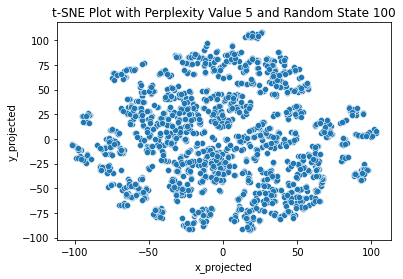

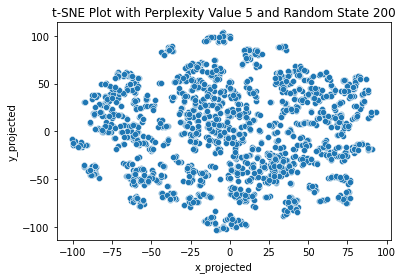

--------------------------------------------


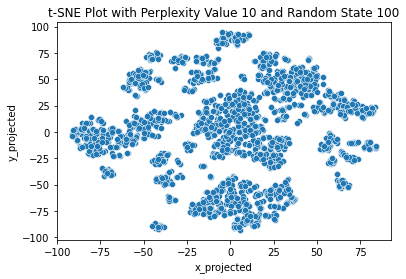

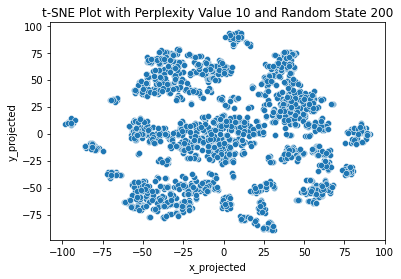

--------------------------------------------


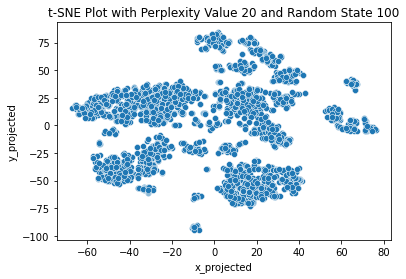

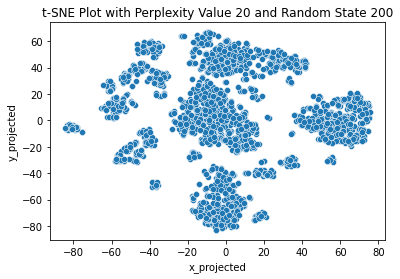

--------------------------------------------


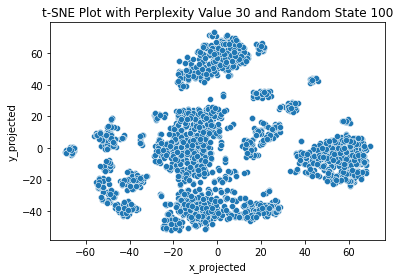

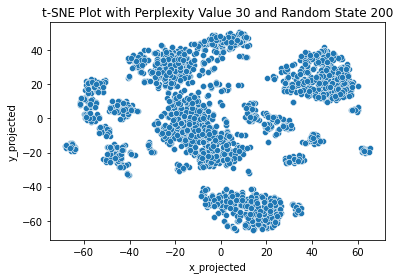

--------------------------------------------


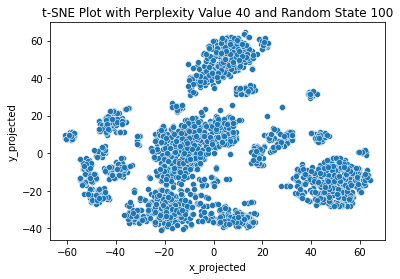

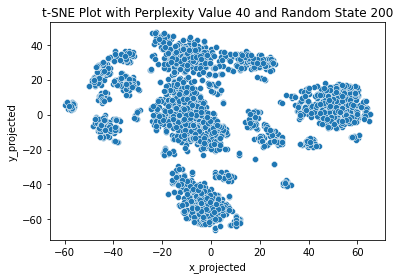

--------------------------------------------


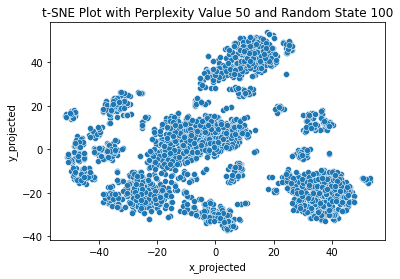

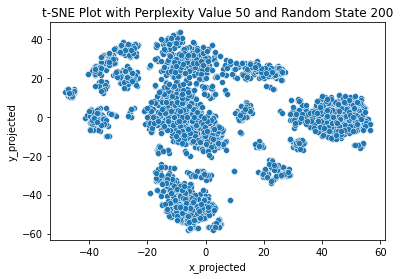

--------------------------------------------


In [30]:
for perp in [5,10,20,30,40,50]:
    for rs in [100,200]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
        data_tsne = tsne.fit_transform(df_num_scaled)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo = pd.concat([df, df_tsne], axis=1)
        sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
        #plt.legend(bbox_to_anchor=(1,1))
        plt.show()
    print('--------------------------------------------')

<font color ='blue'>     

The following observations can be made about the t-SNE Plots above :

* **Choice of Perplexity value**- The perplexity values of 30,40 and 50 indicate that the there are around 4 distinct 'main clusters' in the dataset with multiple sub-clusters for each of them. 

* **Clusterability Interpretation** - Based on the t-SNE plots, the dataset does have distinct clusters and is **definitely clusterable**. We need to make a choice of appropriate clustering algorithm that will help in identifying the underlying clustering structure.

* **Cluster Shape** - From the t-SNE plot with perplexity value 40 and random state 200, we can see that 1 cluster is spherical in nature, while the remaining 3 clusters are cloud shaped or ellipsoidal. 

* **Cluster Overlap** - The t-sne plot (Perp=40, rs=200) indicates that 2 clusters are well separated while two clusters have a high degree of overlap between them.

* **Presence of Sub-Clusters** - All the 4 main clusters have 2-3 sub clusters associated with them 

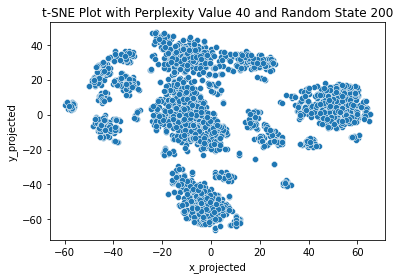

--------------------------------------------


In [31]:
for perp in [40]:
    for rs in [200]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
        data_tsne = tsne.fit_transform(df_num_scaled)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo = pd.concat([df, df_tsne], axis=1)
        sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
        #plt.legend(bbox_to_anchor=(1,1))
        plt.show()
    print('--------------------------------------------')

<font color ='blue'>    

**t-SNE Plot including categorical variables using Gower's matrix**

Let's look at the entire dataset's clustering structure and not just the numerical features. In order to do that, we need to first convert our dataset into a gower's distance matrix and then plot the t-SNE plots to get a sense of the underlying clustering structure.

In [32]:
dist_mat=gower_matrix(X)

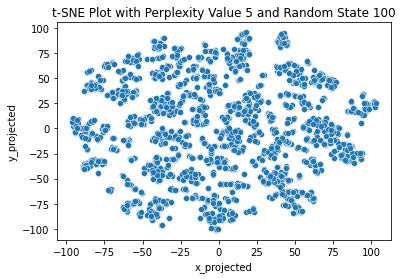

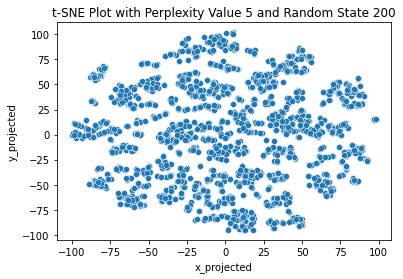

--------------------------------------------


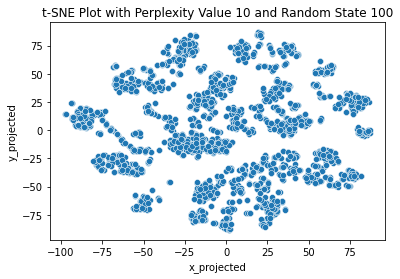

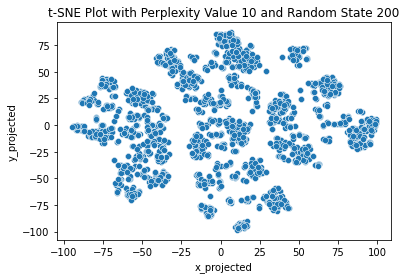

--------------------------------------------


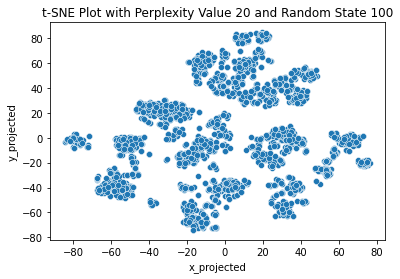

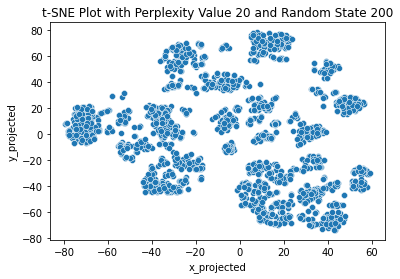

--------------------------------------------


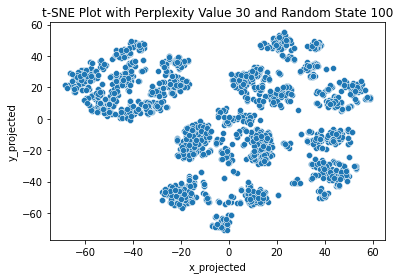

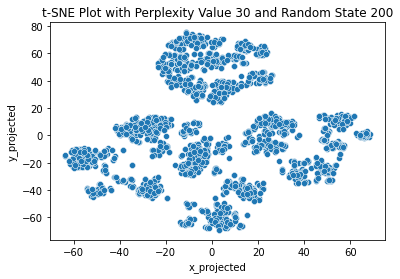

--------------------------------------------


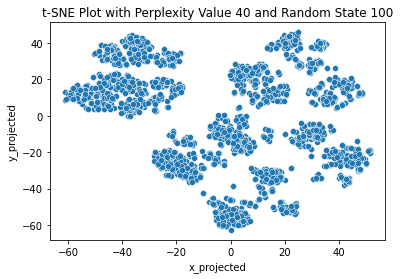

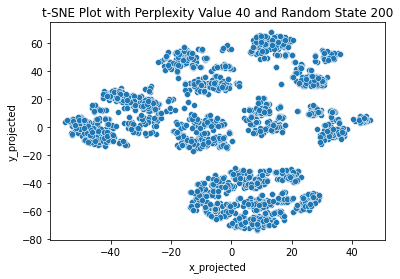

--------------------------------------------


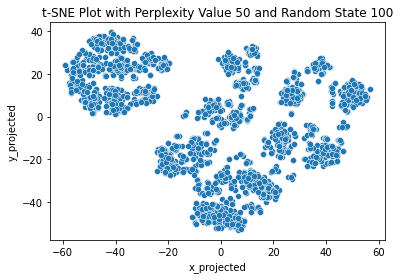

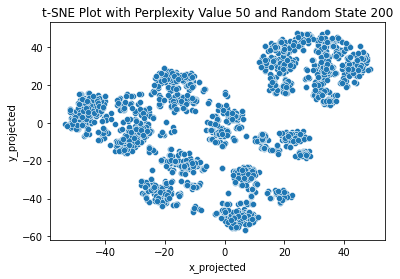

--------------------------------------------


In [33]:
for perp in [5,10, 20, 30, 40, 50]:
    for rs in [100, 200]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs, metric='precomputed')
        data_tsne = tsne.fit_transform(dist_mat)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo = pd.concat([df_stand, df_tsne], axis=1)
        sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
        plt.show()
    print('--------------------------------------------')

<font color ='blue'>     

The following observations can be made about the t-SNE Plots above :

* **Choice of Perplexity value**- The perplexity value 50 indicate that the there are around 3 distinct 'main clusters' in the dataset with multiple sub-clusters for each of them. 

* **Clusterability Interpretation** - Based on the t-SNE plots, the dataset does have distinct clusters and is **definitely clusterable**. 

* **Cluster Shape** - From the t-SNE plot with perplexity value 50 and random state 200, we can see that 1 cluster is spherical in nature, while the remaining 2 clusters are cloud shaped and have varying sparisities.  

* **Cluster Overlap** - The t-sne plot (Perp=50, rs=200) indicates that 2 clusters are highly overlapping while one cluster is well separated

* **Presence of Sub-Clusters** - All the 3 main clusters have 3-4 sub clusters associated with them 

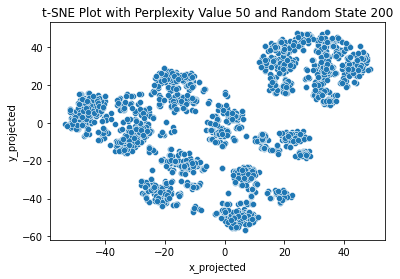

--------------------------------------------


In [34]:
for perp in [ 50]:
    for rs in [200]:
        tsne = TSNE(n_components=2, perplexity=perp, random_state=rs, metric='precomputed')
        data_tsne = tsne.fit_transform(dist_mat)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo = pd.concat([df_stand, df_tsne], axis=1)
        sns.scatterplot(x='x_projected',y='y_projected', data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(perp, rs))
        plt.show()
    print('--------------------------------------------')

### 5.3 Association between the attributes and the clustering structure suggested by the t-SNE plots 

<font color='blue'>
Finally, we want to assess how our 30 attributes are individually associated with the clustering structure suggested by our selectetd t-SNE plots from 5.2.

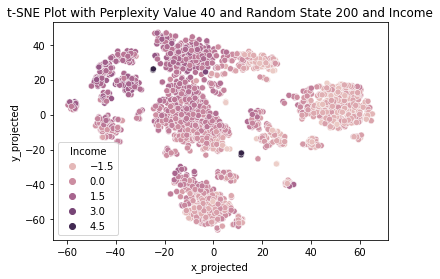

--------------------------------------------


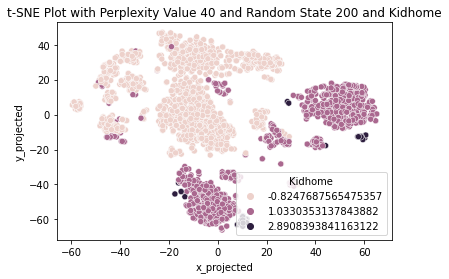

--------------------------------------------


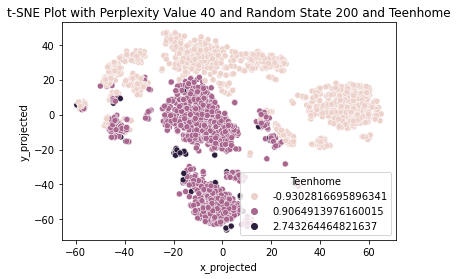

--------------------------------------------


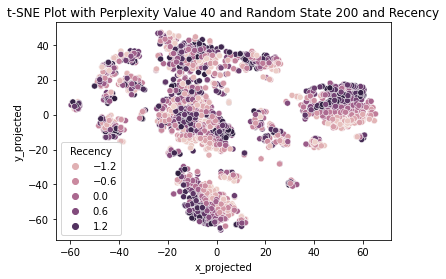

--------------------------------------------


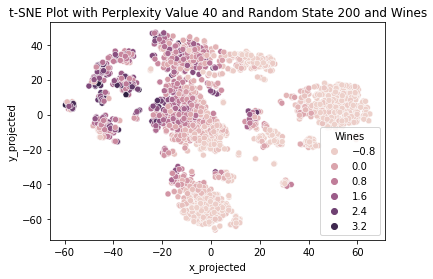

--------------------------------------------


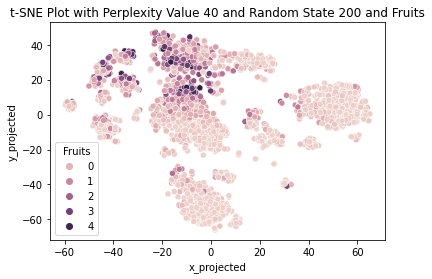

--------------------------------------------


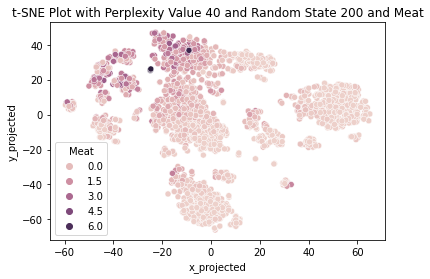

--------------------------------------------


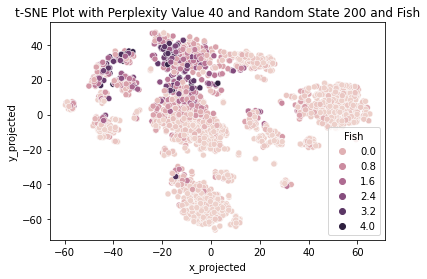

--------------------------------------------


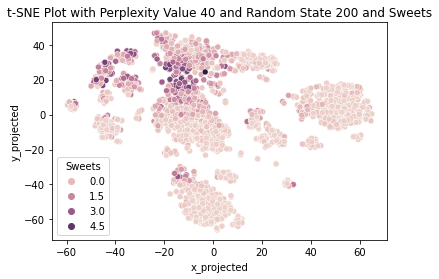

--------------------------------------------


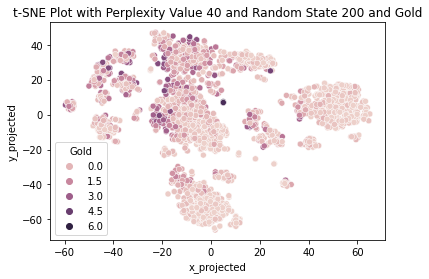

--------------------------------------------


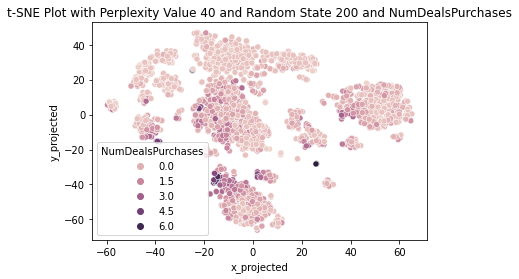

--------------------------------------------


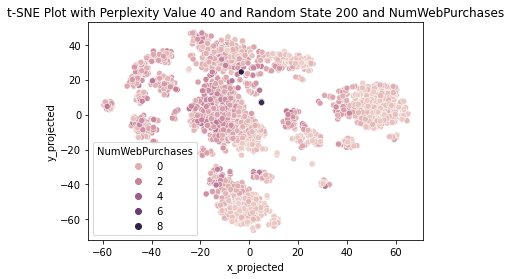

--------------------------------------------


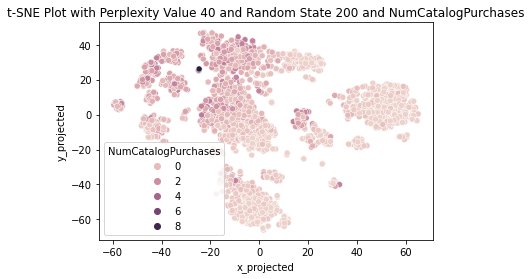

--------------------------------------------


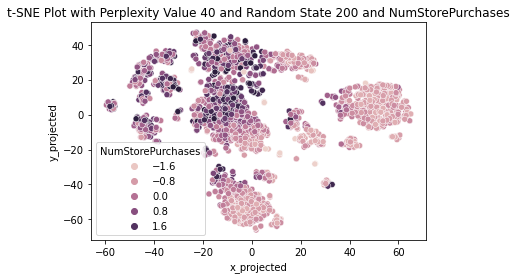

--------------------------------------------


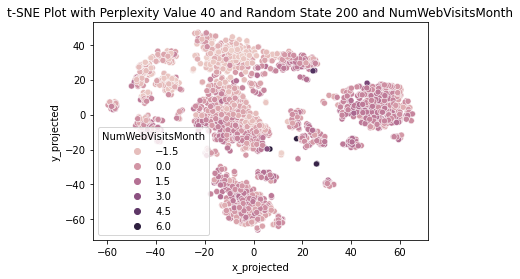

--------------------------------------------


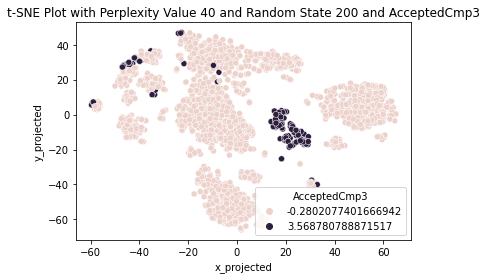

--------------------------------------------


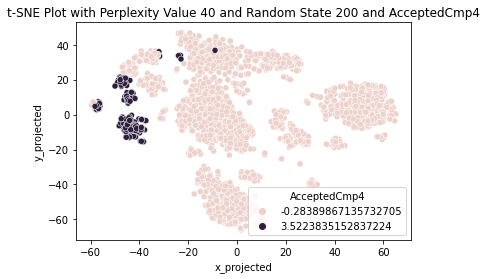

--------------------------------------------


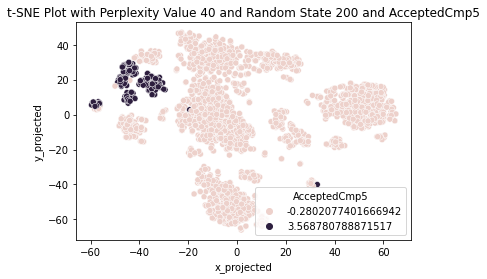

--------------------------------------------


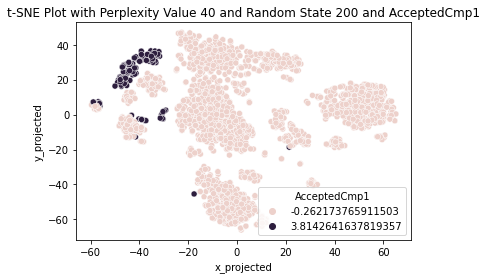

--------------------------------------------


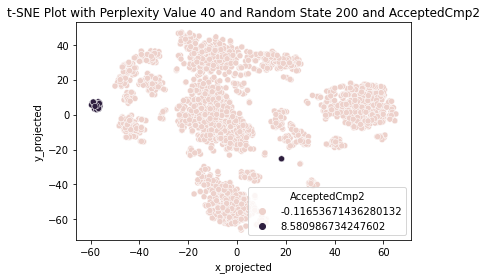

--------------------------------------------


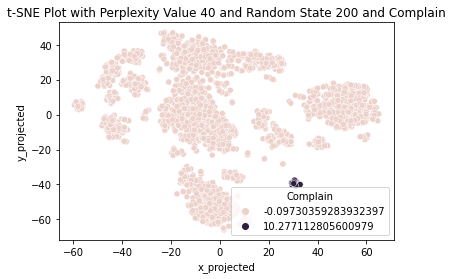

--------------------------------------------


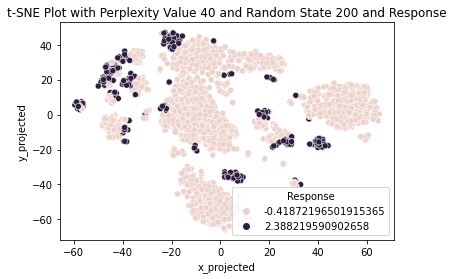

--------------------------------------------


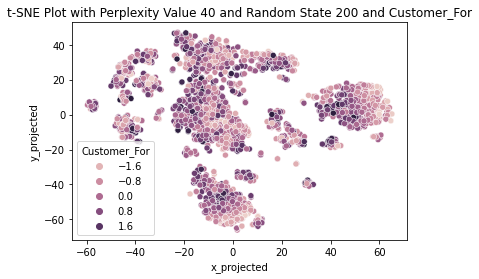

--------------------------------------------


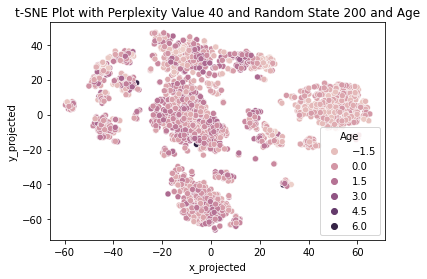

--------------------------------------------


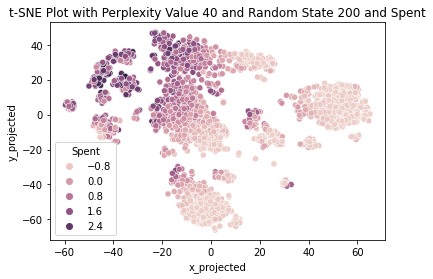

--------------------------------------------


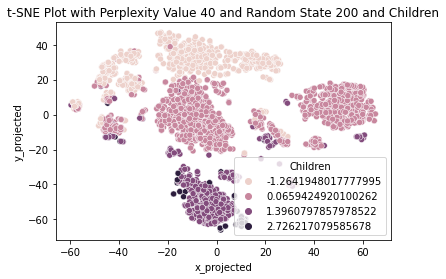

--------------------------------------------


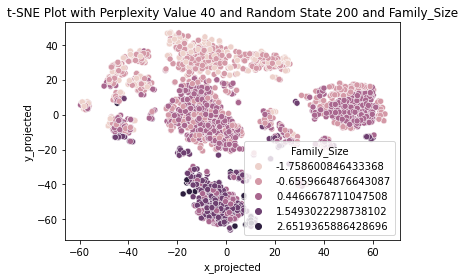

--------------------------------------------


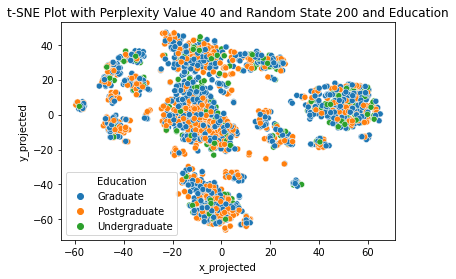

--------------------------------------------


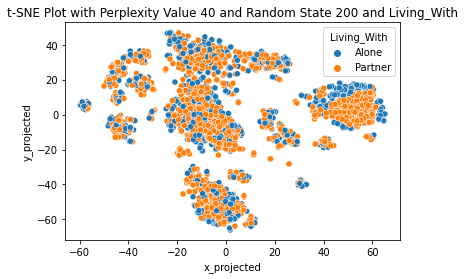

--------------------------------------------


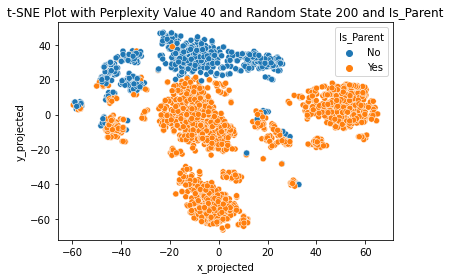

--------------------------------------------


In [35]:
for col in X.columns:
  for perp in [ 40]:
      for rs in [ 200]:
          tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
          data_tsne = tsne.fit_transform(df_num_scaled)
          df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
          df_combo = pd.concat([df_stand, df_tsne], axis=1)
          sns.scatterplot(x='x_projected',y='y_projected',hue=col, data=df_combo)
          plt.title('t-SNE Plot with Perplexity Value %s and Random State %s and %s' %(perp, rs,col))
          plt.show()
      print('--------------------------------------------')

<font color='blue'>



**Observations** 

1. Attributes Teenhome and Kidhome, are clustered strongly, suggesting that the customers having kids or having teens at home is a differentiating factor. <br>
2.The different types of products purchased and the recency of the customer does not not give us a significant information in the clustering cluster. <br>
3. Customers who have accepted offers under different Campaigns run for the marketing are clustered significantly. 
4. Attributes Customer_For and Response is clustered all over the place.
5. The customers who have complained are clustered together. <br>
6. The customers education attribute and the living_with is spread throughout. 
7. The customers who are parents and who are not parents are clustered significantly. 
8. The customers amount spent high amount is showing some trend towards one direction, similarly customers having a particular faimily size is also showing some clustering trend. 
8. NumStorePurchases attribute shows that the customers making high number of purchases have some sort of clustering trend. <br>
9. NumDealPurchases and NumDealPurchases attributes don't reveal much information by looking at their t-sne plots. <br>
10. NumWebVisistsMonth attribute also don't give much information about clustering structure. <br>
11. NumCatalogPurchases has some sort of weak clustering trend we can see by looking at the t-sne plot. <br>

## 6. Algorithm Selection Motivation 



<font color='blue'>

In order to meet our research goals and based on our clusterabilty checks using t-SNE plots, we have decided to use the below 4 unsupervised learning algorithms on the dataset.

* 1. **K-Means** - <br>
    K-means works well with certain properties and we try to look for the same in our t-sne plots. <br>
    We find that, <br> 
    The clusters are somewhat spherical. <br>
    The clusters do not have much noise or outliers when we looked at pairplots. <br>
    The clusters have the same sparsity (interobject distance). <br>
    The clusters are not that well separated. <br>
    By looking at the t-sne plots it seems that there are majorly 4 clusters. <br>
    It seems that each clusters have the same number of objects. <br>
    As our dataset shows these properties, it is a good idea to use K-Means as our first clustering algorithm. <br>
    <br>
* 2. **Hierarchical Agglomerative Clustering**-<br>
    Hierarchical Agglomerative Clustering tells us about the nested relationships amongst the clusters graphically represented as a dendogram. Since observing our t-SNE plots we find that there are some sub clusters of the main clusters, this algorithm can help us identify those clusters and relationships.
Hierarchical Agglomerative Clustering with single linkage does not work well when there are overlapping clusters. By looking at out t-sne plots we find that there is some overlapping of clusters. Hence we can rule out using single linkage.
We explore the other linkages like average, complete and ward's linkage to find the customer segmentation clusters.<br>
      <br>
* 3. **Gaussian Mixture Models** - <br>
    The clusters in our t-sne plots are either spherical or ellipsoidal and gaussian mixture models can be used to detect clusters with these particular shapes. Also Gaussian Mixture models are more flexible in detecting clusters than k-means, it might be able to detect the clusters in our dataset. <br>
    It allows us to estimate the covariance matrices of the clusters rather than just the means, it might help us understand which attributes contribute to the most variance in the dataset. <br>
    Since our dataset doesn't have much noise or outliers Gaussian Mixture models might work well with our dataset. <br>
    Most of the datasets are assumed to be generated by a random process which can be estimated by  Gaussian Mixture models using a statistical model. Hence we might be able to find the random process of our dataset. <br>
    <br> 

## 7. K-Means Algorithm - Clustering the dataset and Post-Cluster Analysis

### 7.1 Parameter Selection

<font color='blue'>

For K- Means to work we need to select the number of clusters as input to the algorithm . We need to create an elbow plot in order to select the optimum number of clusters(k). 

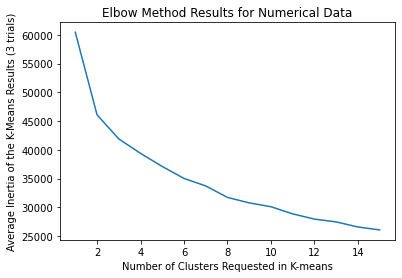

In [36]:
cluster_num_list=range(1,16)
avg_inertia_list=[]
for k in cluster_num_list:
    #print('k= '+str(k))
    sub_inertia_list=[]
    for i in range(0,3):
        kmeans=KMeans(n_clusters=k).fit(df_num_scaled)
        sub_inertia_list.append(kmeans.inertia_)
    avg_inertia_list.append(np.average(sub_inertia_list))


plt.plot(cluster_num_list,avg_inertia_list)
plt.xlabel('Number of Clusters Requested in K-means')
plt.ylabel('Average Inertia of the K-Means Results (3 trials)')
plt.title('Elbow Method Results for Numerical Data')
plt.show()

<font color='blue'>

We can see that there is no dramatic elbow in the plot above. This indicates that k-means is not able to detect the underlying clustering structure of the dataset. Part of this might be due to the fact that the clusters as suggested in the t-SNE plot are not well separated and therefore k-means is not able to work well on this dataset. Let us consider k=4 as our number of cluster input to the k-means algorithm and apply the algorithm on our dataset with numerical features.

### 7.2 Applying K-Means

In [307]:

df_label=pd.DataFrame()
kmeans=KMeans(n_clusters=4).fit(df_num_scaled)
df_label['predicted_cluster_kmeans']=kmeans.labels_

### 7.3 K-Means Results presentation 

Let's plot our t-SNE plot with the points color coded according to the cluster labels in our k-means algorithm

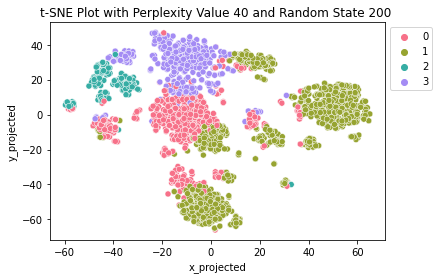

--------------------------------------------


In [38]:
k=len(df_label['predicted_cluster_kmeans'].unique())
col=df_label['predicted_cluster_kmeans']
for perp in [ 40]:
      for rs in [ 200]:
          tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
          data_tsne = tsne.fit_transform(df_num_scaled)
          df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
          df_combo = pd.concat([df_stand, df_tsne], axis=1)
          sns.scatterplot(x='x_projected',y='y_projected',hue=col,palette=sns.color_palette("husl", k), data=df_combo)
          plt.title('t-SNE Plot with Perplexity Value %s and Random State %s ' %(perp, rs))
          plt.legend(bbox_to_anchor=(1,1))
          plt.show()
      print('--------------------------------------------')

<font color='blue'>

**Observation** 

We can see that k-means is not able to completely identify the underlying clustering structure of the dataset. Cluster 2 for example has customers who are highly dissimilar with each other. We can check how cohesive and well separated these clusters are through silhouette scores and cluster sorted similarity matrix.

### 7.4 Assessing Cluster Cohesion and Separation 


<font color='blue'>
    
**Silhouette Score**

In [39]:
k_means_silhouette_avg = silhouette_score(df_num_scaled, df_label['predicted_cluster_kmeans'])
print("The average silhouette_score is :", k_means_silhouette_avg)


The average silhouette_score is : 0.1862725815049126


<font color='blue'>

The average silhouette score is somewhat low indicating a less cohesive and separated clustering. Let's plot the silhouette plot to assess the coehisiveness of individual clusters.

In [40]:
def create_silhouette_plot(X, cluster_labels):
    #------------------------------------------------------
    #INPUT:
    #-----------------------------------------------------
    #X=dataframe of objects you clusterted
    #cluster_labels=cluster labels of each of the objects in the dataset X that you just clustered 

    #Gets the unique labels in the cluster_labels
    clabels=np.unique(cluster_labels)
    #Gets the number of unique labels
    k=len(clabels)
    
    #-------------------------------------------------------
    #SETTING UP THE PLOT SPACE
    # Create a subplot with 1 row and 1 columns
    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)
    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (k+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (k + 1) * 10])

    #FINDS THE SILHOUETTE SCORE FOR EACH OBJECT
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10

    
    for i in clabels:
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / k)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    plt.show()

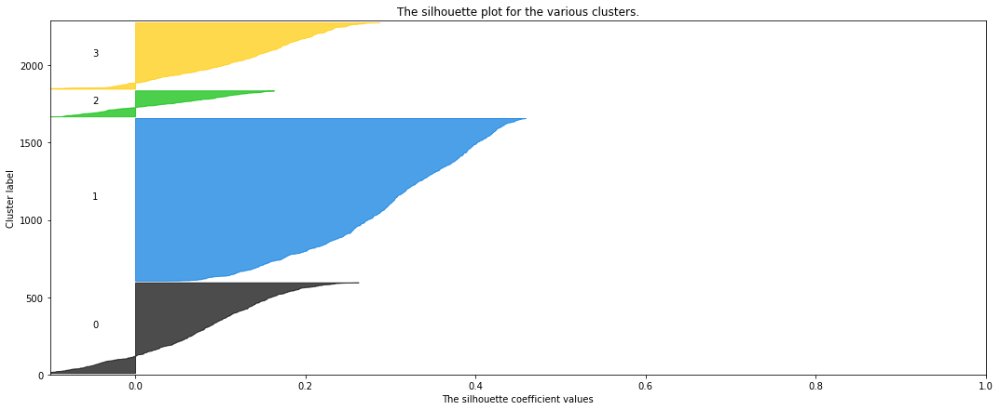

In [41]:
create_silhouette_plot(df_num_scaled, df_label['predicted_cluster_kmeans'])

<font color='blue'>

**Interpretation** 

All the clusters have a sharp silhouette plot indicating that only a few data points have a high silhouette scores while the rest have low silhouette score. Additionally,`Cluster 0`, `Cluster 1` and `Cluster 3` have a few points which have a negative silhouette score indicating that they should belong to another cluster.


<font color='blue'>

**Cluster-Sorted Similarity Matrix**

In [318]:
#Sort the matrix
df_num_scaled['predicted_cluster_kmeans']=df_label['predicted_cluster_kmeans']
df_sort=df_num_scaled.sort_values(by='predicted_cluster_kmeans')

df_sort.head()

,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,...,AcceptedCmp2,Complain,Response,Customer_For,Age,Spent,Children,Family_Size,predicted_cluster_kmeans,predicted_cluster_gmm
0,0.290037,-0.824769,-0.930282,0.306624,0.983339,1.551126,1.679196,2.461517,1.476020,0.842815,...,-0.116537,-0.097304,2.388220,1.976802,0.984922,1.678944,-1.264195,-1.758601,0,2
392,1.043053,-0.824769,-0.930282,0.582894,0.210770,3.160274,0.744299,1.015303,1.548700,0.708621,...,-0.116537,-0.097304,-0.418722,-1.149725,-2.019379,0.865180,-1.264195,-1.758601,0,2
1269,1.564734,-0.824769,-0.930282,0.824630,0.968482,-0.007737,1.967197,0.118285,-0.219847,0.191013,...,-0.116537,-0.097304,-0.418722,-1.481327,0.901469,1.290330,-1.264195,-1.758601,0,2
777,1.041049,-0.824769,-0.930282,1.411703,1.117053,-0.384881,0.996854,0.685786,-0.655927,-0.844203,...,-0.116537,-0.097304,-0.418722,-0.852576,0.901469,0.916663,-1.264195,-0.655966,0,2
779,0.948198,-0.824769,0.906491,-0.729388,0.647569,-0.661454,1.572857,3.468374,2.251273,1.724666,...,-0.116537,-0.097304,-0.418722,-0.645863,-0.183417,1.526156,0.065942,-0.655966,0,2


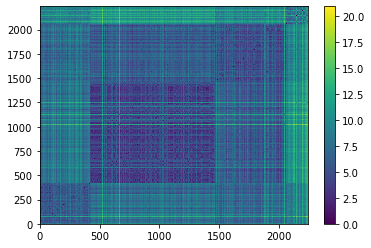

In [319]:
#Create a distance matrix
dist_mat = squareform(pdist(df_sort))
N = len(df_sort)
plt.pcolormesh(dist_mat)
plt.colorbar()
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()

<font color='blue'>
    
**Interpretation** 

* `Cluster 0` and `Cluster 1` show relatively high cohesion while `Cluster 2` and `Cluster 3` are not that cohesive.
*  Distance between `Cluster 0` and `Cluster 1` is relatively small indicating they might be indistinguishable. 
*  There are a few yellow lines running through the matrix indicating that they might be far apart from all the clusters and might be outliers.


<font color='blue'>
    
**Correlation between Ideal Sorted Pairwise Distance Matrix and Actual Sorted Pairwise Distance Matrix**

In [320]:
#Find the maximum distance in the distance matrix
min_dist=np.min(dist_mat)
#"Find" the minimum distance in the distance matrix (this will be 0) from the diagonals... ie. the distance between an object and itself is 0.
max_dist=np.max(dist_mat)

#Similarity matrix
sim_mat=1-(dist_mat-min_dist)/(max_dist-min_dist)
sim_mat

array([[1.        , 0.67866144, 0.69303261, ..., 0.64455216, 0.5389033 ,
        0.34512252],
       [0.67866144, 1.        , 0.75611824, ..., 0.68186701, 0.59888629,
        0.39540569],
       [0.69303261, 0.75611824, 1.        , ..., 0.65016807, 0.65797569,
        0.40267636],
       ...,
       [0.64455216, 0.68186701, 0.65016807, ..., 1.        , 0.66962265,
        0.42372333],
       [0.5389033 , 0.59888629, 0.65797569, ..., 0.66962265, 1.        ,
        0.51453694],
       [0.34512252, 0.39540569, 0.40267636, ..., 0.42372333, 0.51453694,
        1.        ]])

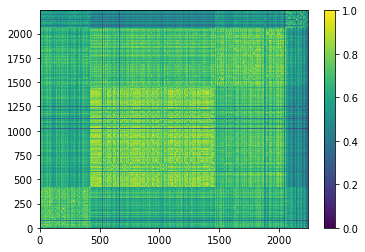

In [321]:
#Create a distance matrix
plt.pcolormesh(sim_mat)
plt.colorbar()
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()

In [322]:
from scipy.linalg import block_diag

#Count the number of objects in each cluster, and sort by cluster label
cluster_sizes=df_num_scaled['predicted_cluster_kmeans'].value_counts().sort_index()
print(cluster_sizes)

#Create a list of 1-by-1 square matrices, each matrix is the size of a cluster
block_list=[]
for i in cluster_sizes:
    print(i)
    block_list.append(np.ones((i,i)).tolist())

#Put these 1-by-1 square matrices on the block diagonal of an otherwise 0-matrix
#Then do 1-(this matrix)
ideal_sim_mat=block_diag(block_list[0], block_list[1], block_list[2],block_list[3])
ideal_sim_mat

0     421
1    1049
2     589
3     180
Name: predicted_cluster_kmeans, dtype: int64
421
1049
589
180


array([[1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.]])

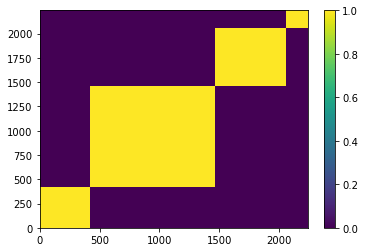

In [323]:
#Create a distance matrix
plt.pcolormesh(ideal_sim_mat)
plt.colorbar()
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()

In [324]:
flat_sim_mat=sim_mat[0]
for i in sim_mat[1:len(sim_mat)]:
    flat_sim_mat+=i

flat_ideal_sim_mat=ideal_sim_mat[0]
for i in ideal_sim_mat[1:len(ideal_sim_mat)]:
    flat_ideal_sim_mat+=i

kmeans_corr=np.corrcoef(flat_sim_mat,flat_ideal_sim_mat)

np.corrcoef(flat_sim_mat,flat_ideal_sim_mat)


array([[1.        , 0.59489195],
       [0.59489195, 1.        ]])

<font color='blue'>

The correlation between the ideal sorted pairwise distance matrix and the actual matrix is around 0.60 which is pretty decent. But if the clusters through k-means were well separated than the value could have been higher.

<font color='blue'>

**Calinski Harabasz Score**

In [313]:
kmeans_calinski=calinski_harabasz_score(df_num_scaled, df_label['predicted_cluster_kmeans'])
calinski_harabasz_score(df_num_scaled, df_label['predicted_cluster_kmeans'])

467.529031470769

<font color='blue'>
    
The Calinski Harabasz Score for K means clustering is pretty high. A higher score indicates that the clusters are cohesive and well separated.

### 7.5 Describing Each of the Clusters 

<font color='blue'>

**Using Numerical Features**

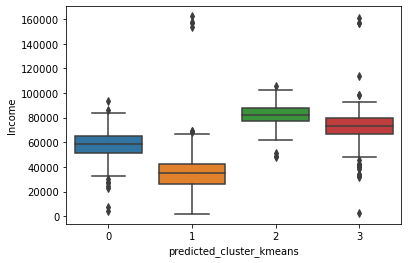

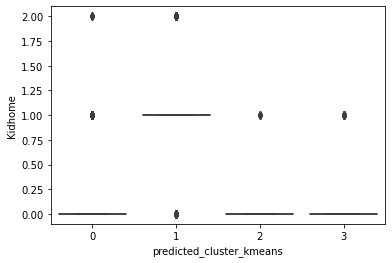

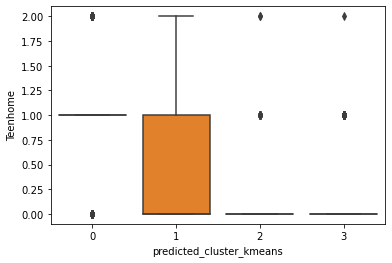

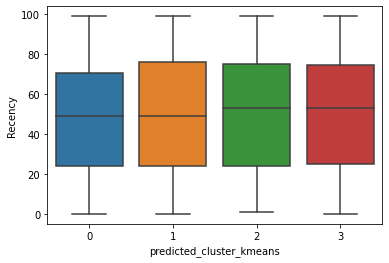

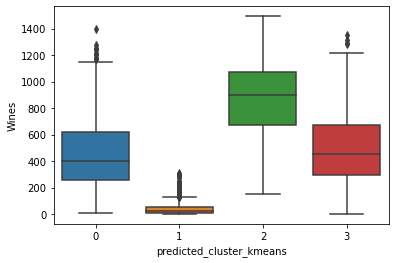

...

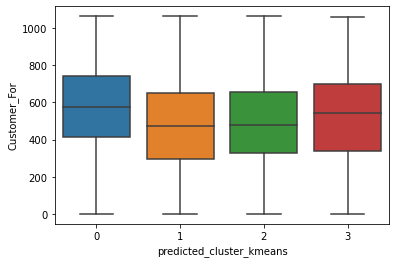

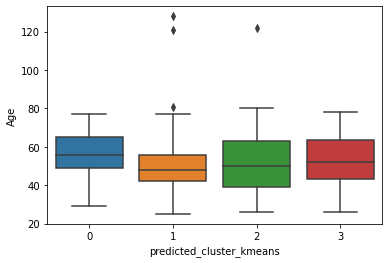

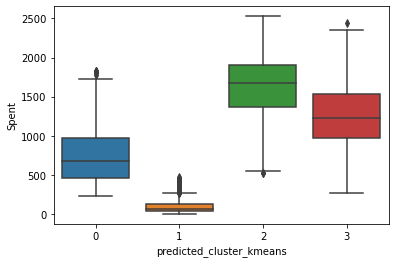

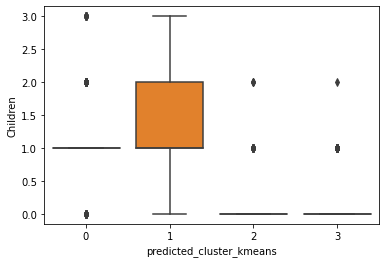

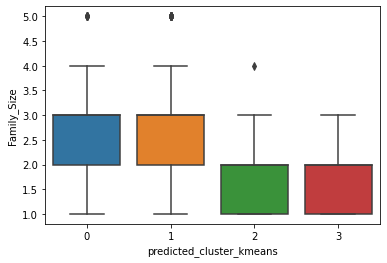

In [49]:
for col in ['Income', 'Kidhome', 'Teenhome', 'Recency', 'Wines', 'Fruits', 'Meat','Fish', 'Sweets', 'Gold', 'NumDealsPurchases', 'NumWebPurchases','NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth','Customer_For', 'Age', 'Spent', 'Children', 'Family_Size']:
    sns.boxplot(x=df_label['predicted_cluster_kmeans'], y=col, data=df)
    plt.show()

<font color='blue'>

**Using Categorical/Promotional Features**

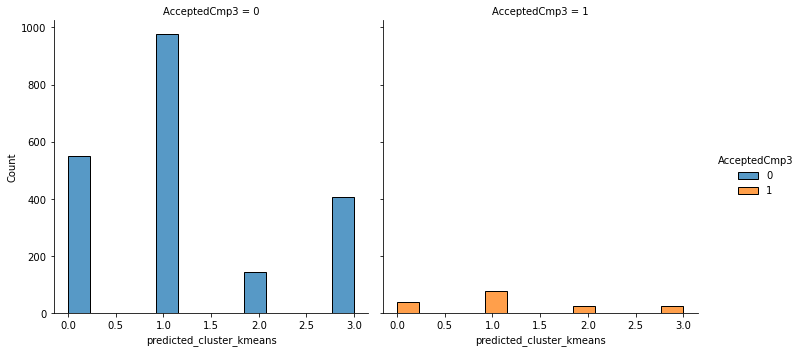

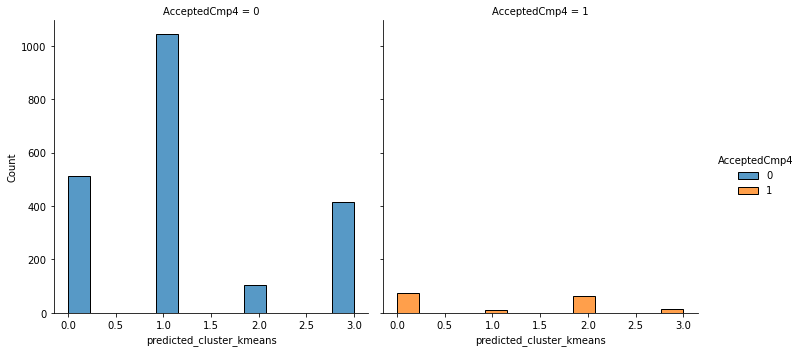

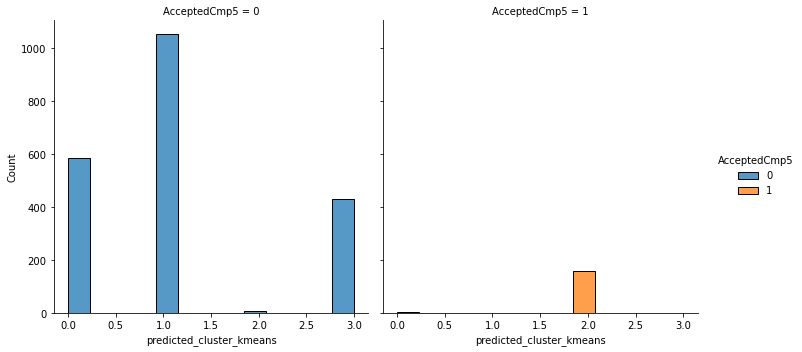

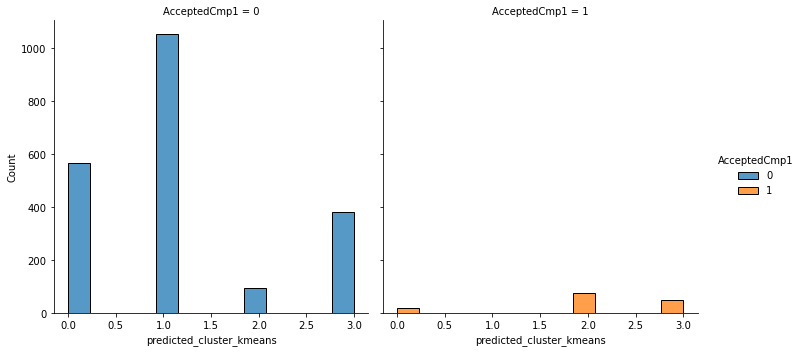

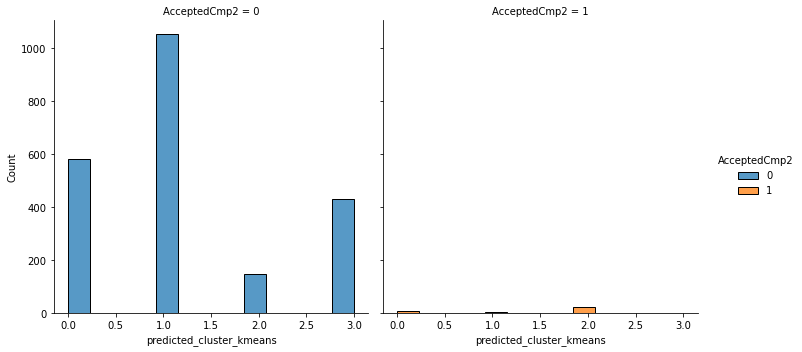

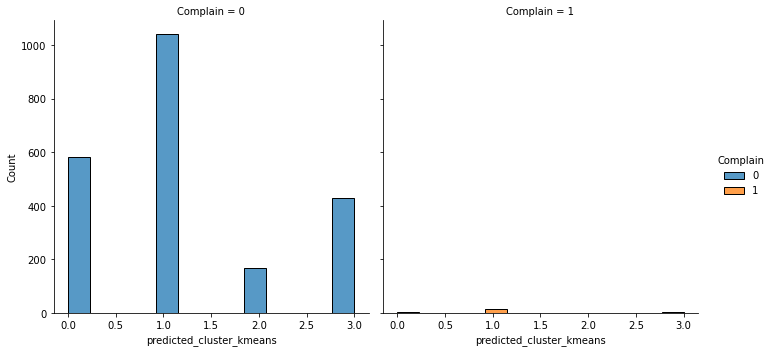

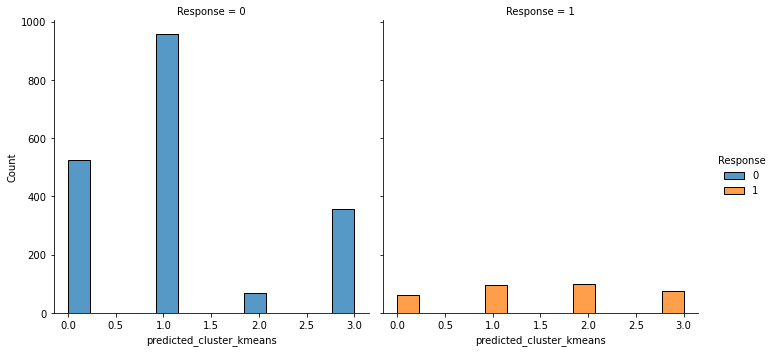

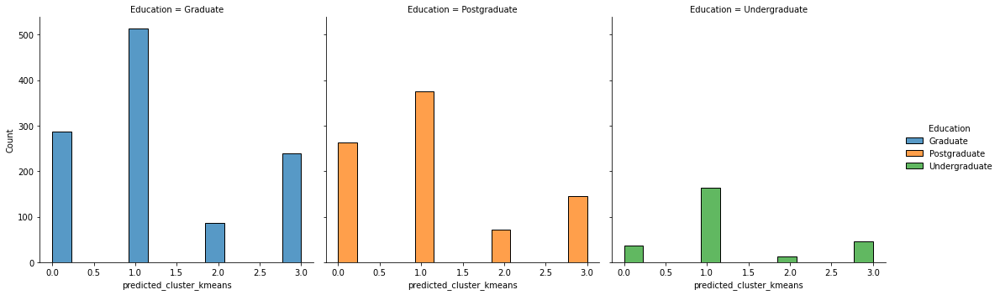

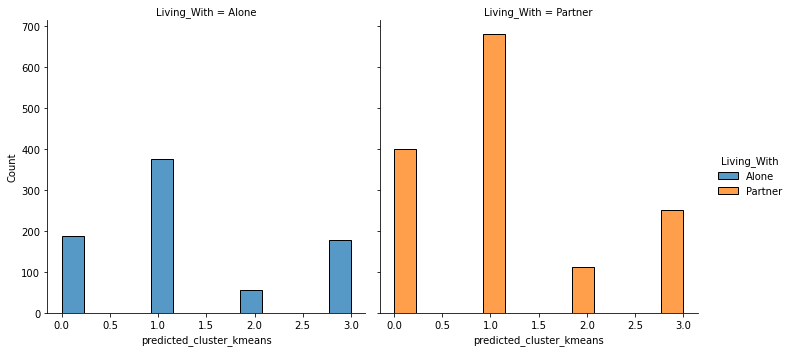

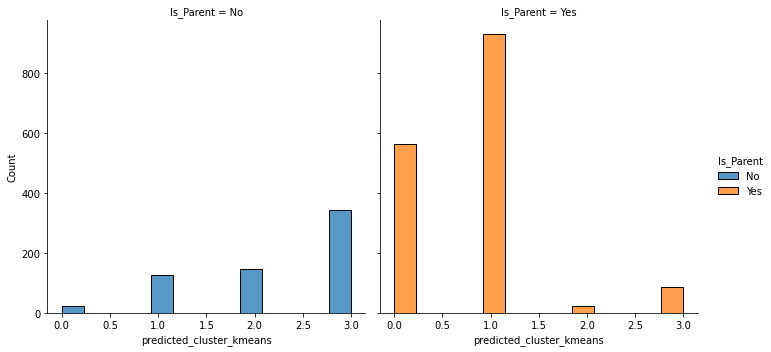

In [50]:
for col in [ 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1','AcceptedCmp2', 'Complain', 'Response','Education', 'Living_With', 'Is_Parent']:
    sns.displot(x=df_label['predicted_cluster_kmeans'], hue=col, col=col,data=df)
    plt.show()

<font color='blue'>

**Insights**

`Cluster 0`

* **Customer Demographic Profile** - Customers have mostly low income and middle aged with family. Most of the customers have children.Among all other clusters, the customers in `Cluster 0` have registered the most number of complaints. 
* **Spend Behaviour**- Customers spend least amount of money on all the products offered by the retail firm which is obvious due to their low income. 
* **Response to Deals and Promotions**- There response is moderate to deals offered to them. They have responded well to marketing campaign 3.  
* **Channel of Purchase** - The tend to visit the website of the retail store but most of their purchases are in-store.

`Cluster 1`

* **Customer Demographic Profile** - The customers belong to the highest income segment ; they are mostly middle aged but with higher variance in age (Ages range from 40-60). Most of these customers live with a partner.
* **Spend Behaviour** - They are among the group of customers who spend the most oweing to high income. They spend the most on Wine and Gold which are generally expensive.
* **Response to Deals and Promotions** - Their response to Campaign 1,4 and 5 was very good
* **Channel of Purchase** - They usually purchase their products through all channels - Web, Catalog and Stores

`Cluster 2`

* **Customer Demographic Profile** - Their income is towards the higher end. They are mostly middle aged graduates, living with a partner and have no children.
* **Spend Behaviour** - They tend to spend higher on fruits, fish and sweet products.
* **Response to Deals and Promotions** - They had a good response to campaign 1 and the latest campaign.
* **Channel of Purchase** - Although their visits to the website is low, most of their purchases are through all channels ; Store, Catalog and Website


`Cluster 3`

* **Customer Demographic Profile** -They belong to the second lowest income group and belong to a higher age bracket than average. They are educated with most of them having graduate or post-graduate degrees.Most of them live with partners and have children
* **Spend Behaviour**- Oweing to the low income, they are moderate spenders on all products
* **Response to Deals and Promotions**- They have higher amount of purchases through deals and have responded well to campaign 3 and campaign 4.
* **Channel of Purchase**- Most of their purchases are through web and in-store.



## 8. HAC with Different Linkage - Clustering the dataset and Post-Cluster Analysis

### 8.1 Parameter Tuning and  Dendograms of Different Linkages

<font color='blue'>
From the t-SNE plots we can see that some of our clusters are not well separated and some are spherical in nature. So we should consider running Hierarchical Aglomerative clustering using the below 3 linkages: 

* Complete Linkage
* Average Linkage 
* Single Linkage 

**Complete Linkage**

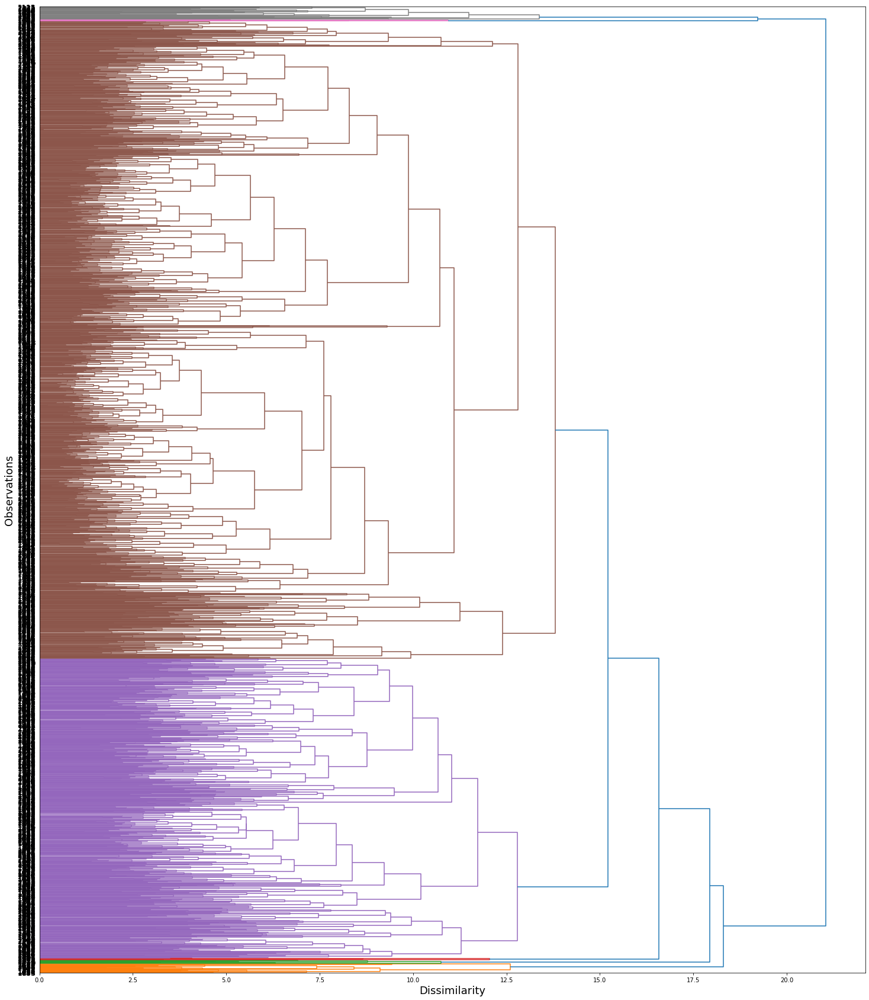

In [200]:
dm = pdist(df_num_scaled, metric='euclidean')
Z = linkage(dm, method='complete')

fig, ax = plt.subplots(figsize=(25, 30))
d = dendrogram(Z, orientation='right', ax=ax)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('Observations', fontsize=18)
plt.yticks(fontsize=12)
plt.show()

<font color='blue'>
    
**Interpretation**

From the dendogram above we can see that there are 2 main clusters while there are 2-3  small sub-clusters which are mostly singleton in nature. Let's us see if the t-SNE plot for k=2,3...9 agree with the clustering nature suggested with by the dendogram above.


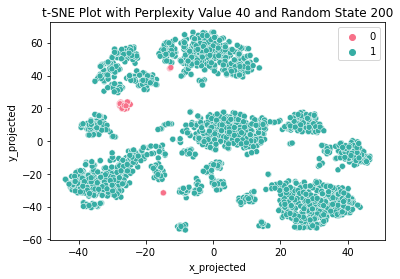

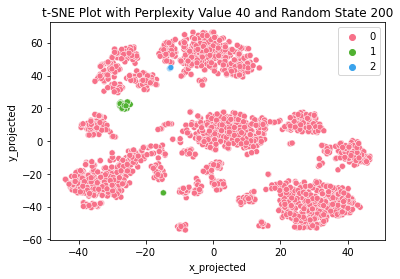

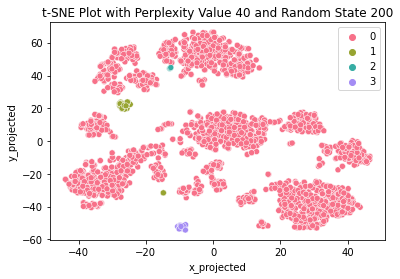

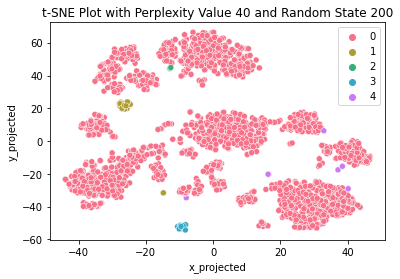

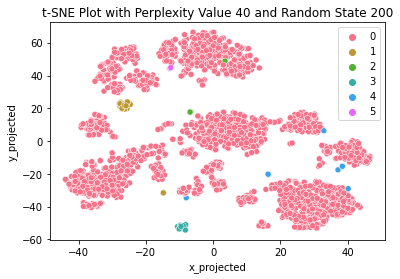

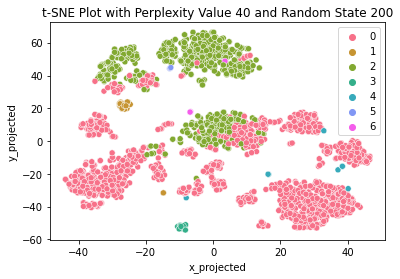

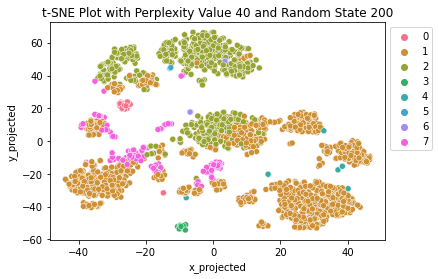

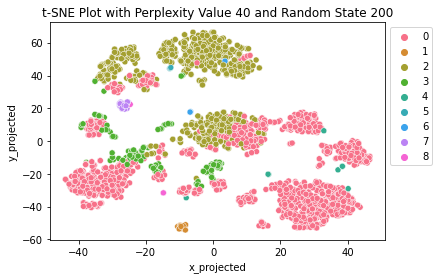

In [201]:
for k in range(2,10):
        #Clustering from dendrogram with k clusters
        hac = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='complete')
        label = hac.fit_predict(df_num_scaled)
        tsne = TSNE(n_components=2, perplexity=40, random_state=200)
        data_tsne = tsne.fit_transform(df_num_scaled)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo = pd.concat([df, df_tsne], axis=1)
        sns.scatterplot(x='x_projected',y='y_projected',hue=label,palette=sns.color_palette("husl", k) ,data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(40, 200))
    
   
        plt.legend(bbox_to_anchor=(1,1))
        plt.show()

<font color='blue'>

**Interpretation**

Although HAC with complete linkage is able to identify two main clusters in the dataset, for k=7 to k=9, the sub clusters it identifies are mostly singleton clusters . Additionally, the cluster labels don't agree with the clustering structure as suggested by our t-SNE plot. **So we won't be using HAC with complete linkage for clustering this dataset**

**Average Linkage** 

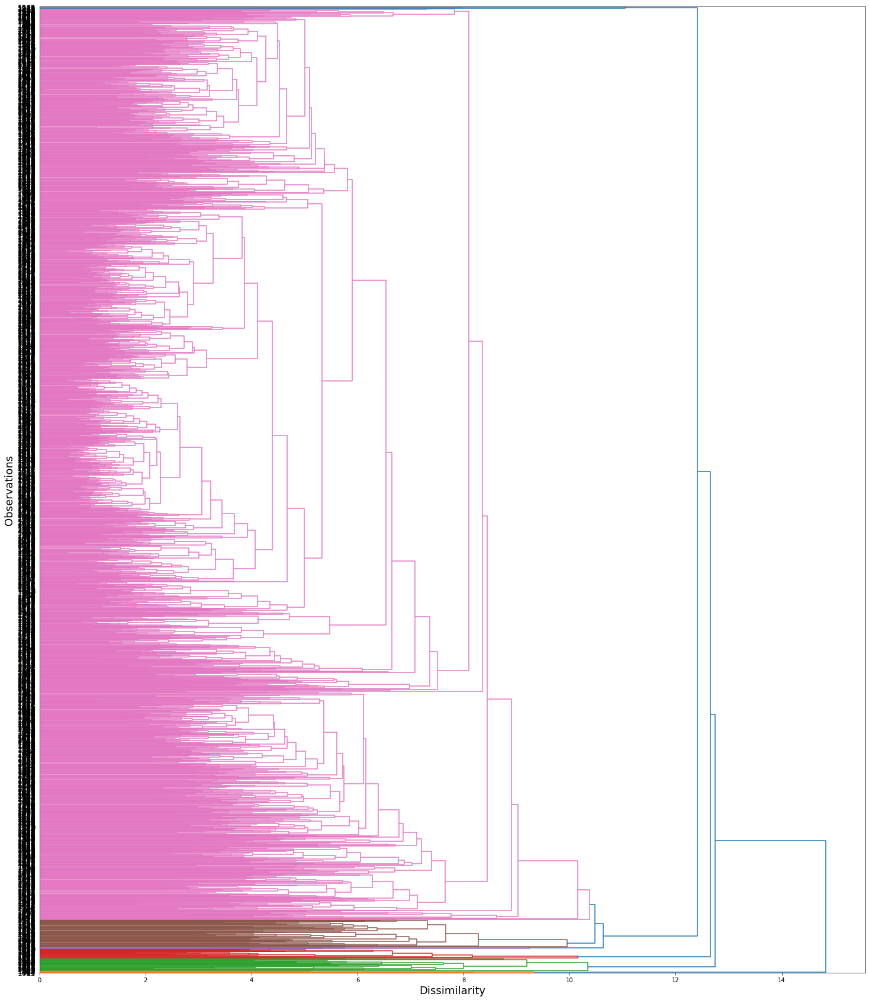

In [202]:
dm = pdist(df_num_scaled, metric='euclidean')
Z = linkage(dm, method='average')

fig, ax = plt.subplots(figsize=(25, 30))
d = dendrogram(Z, orientation='right', ax=ax)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('Observations', fontsize=18)
plt.yticks(fontsize=12)
plt.show()

<font color='blue'>

**Interpretation**

The dendogram above shows that HAC with average linkage has identified 1 major cluster with most of the datapoints, while all other points are bucketed under 2-3 small subclusters. Let's look at the t-SNE plots for different cluster labels and see if the clustering by HAC with average linkage agrees with the clustering suggested by t-SNE plots.

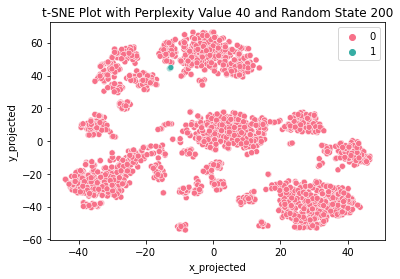

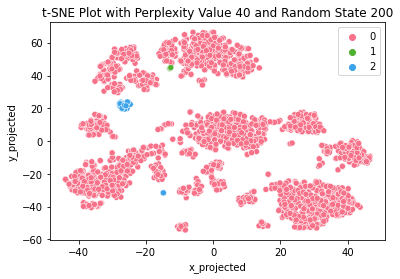

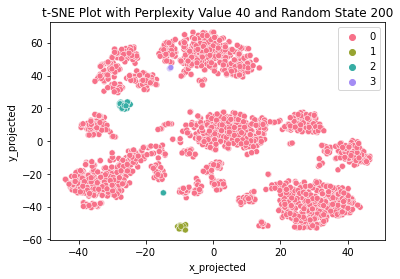

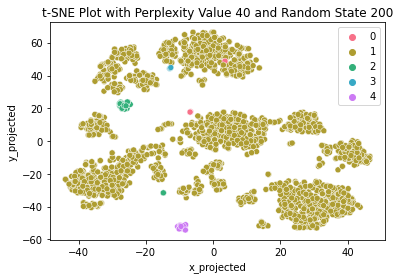

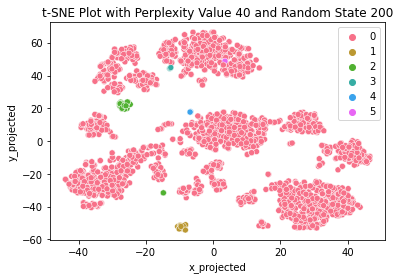

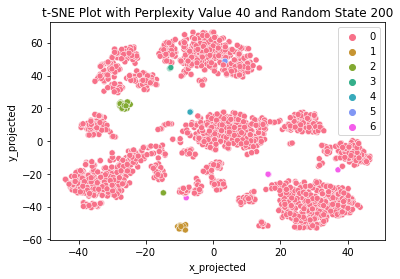

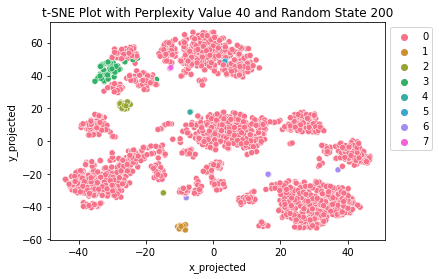

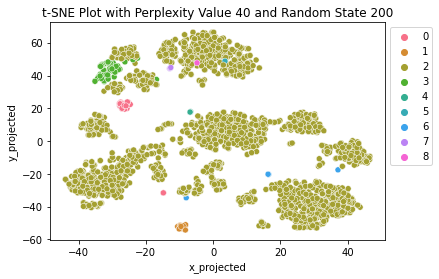

In [203]:
for k in range(2,10):
        #Clustering from dendrogram with k clusters
        hac = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='average')
        label = hac.fit_predict(df_num_scaled)
        tsne = TSNE(n_components=2, perplexity=40, random_state=200)
        data_tsne = tsne.fit_transform(df_num_scaled)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo = pd.concat([df, df_tsne], axis=1)
        sns.scatterplot(x='x_projected',y='y_projected',hue=label,palette=sns.color_palette("husl", k) ,data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(40, 200))
    
   
        plt.legend(bbox_to_anchor=(1,1))
        plt.show()

<font color='blue'>

**Interpretation**

As expected, HAC with average linkage picks of most of the points and buckets them under a single cluster. This doesn't at all agree with the underlying clustering structure of our data, and **we won't be proceeding with HAC with average linkage as well**

**Ward's Linkage**


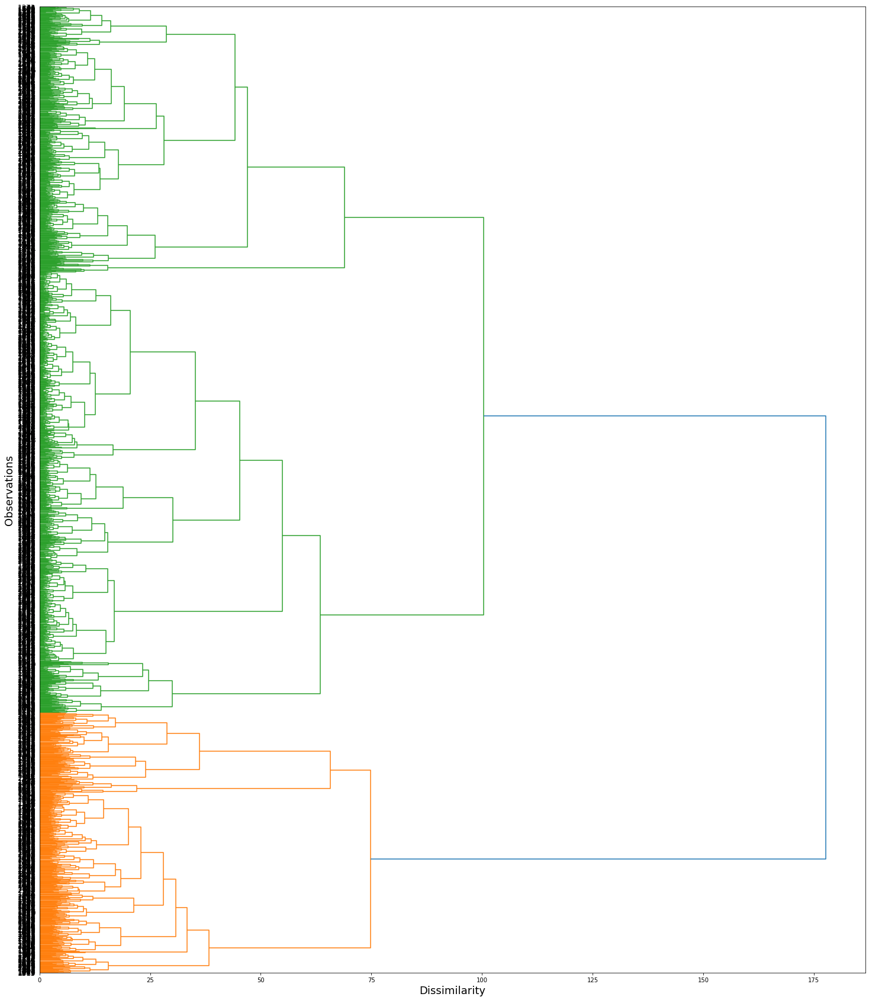

In [204]:
dm = pdist(df_num_scaled, metric='euclidean')
Z = linkage(dm, method='ward')

fig, ax = plt.subplots(figsize=(25, 30))
d = dendrogram(Z, orientation='right', ax=ax)
ax.set_xlabel('Dissimilarity', fontsize=18)
ax.set_ylabel('Observations', fontsize=18)
plt.yticks(fontsize=12)
plt.show()

<font color='blue'>

**Interpretation**

From the dendogram, we can see that there 2 main clusters in the data and both of them have sufficient number of datapoints. Additionally for k=3, 4 and 5 we see that we are getting smaller subclusters, but the HAC with Ward's linkage is not picking off singleton clusters like the preceding two linkages. So this looks like our best bet in clustering our dataset. Let's see the t-SNE plot for different cluster numbers and confirm whether the clustering agrees with the underlying clustering structure.

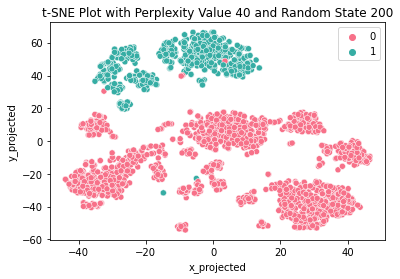

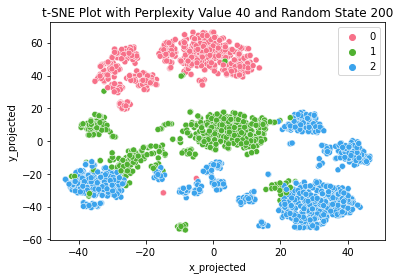

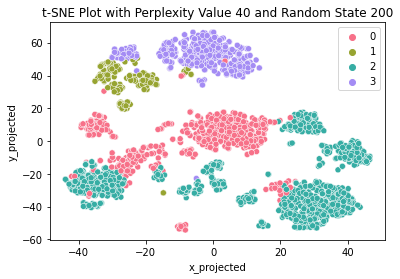

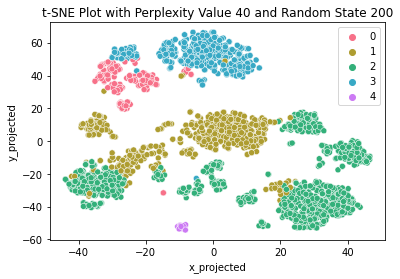

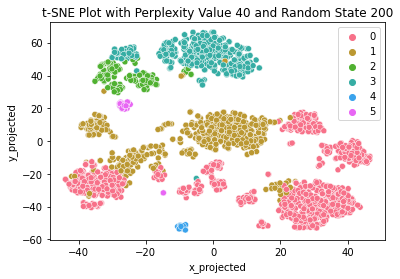

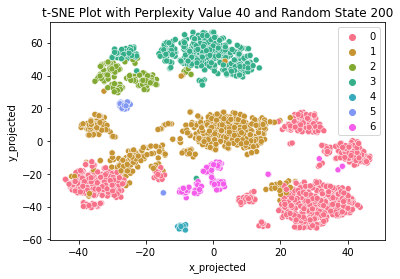

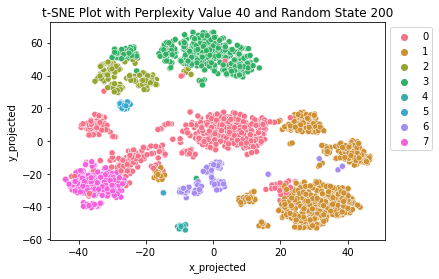

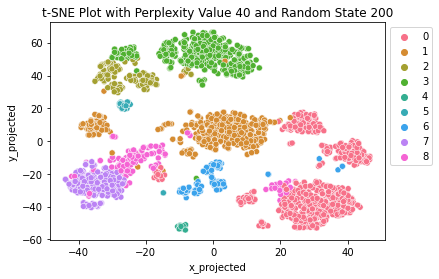

In [205]:
for k in range(2,10):
        #Clustering from dendrogram with k clusters
        hac = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage='ward')
        label = hac.fit_predict(df_num_scaled)
        tsne = TSNE(n_components=2, perplexity=40, random_state=200)
        data_tsne = tsne.fit_transform(df_num_scaled)
        df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
        df_combo = pd.concat([df, df_tsne], axis=1)
        sns.scatterplot(x='x_projected',y='y_projected',hue=label,palette=sns.color_palette("husl", k) ,data=df_combo)
        plt.title('t-SNE Plot with Perplexity Value %s and Random State %s' %(40, 200))
    
   
        plt.legend(bbox_to_anchor=(1,1))
        plt.show()

<font color='blue'>

**Interpretation**

We can observe that the HAC with ward's linkage performs better to identify the overlapping nature of the clustering strucure of our dataset and at the same  time has identified decent subscluters and hasn't picked off singleton clusters. One point of concern is the cluster labelled `Cluster 0` which is probably the least cohesive of the cluster labels. **Based on the results, we will be proceeding with HAC with Ward's linkage to cluster our dataset** 

But before proceeding further, we need to pick up the optimum number of clusters which gives us the highest silhouette score and the highest calinski harabasz score.

<font color='blue'>

**Finding the number of clusters with maximum silhoutte score**

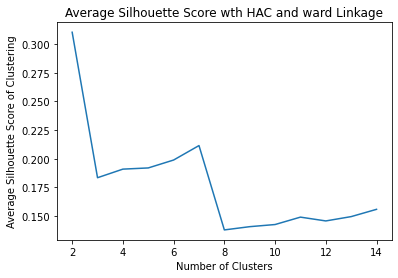

In [207]:
for link in ['ward']:
    avg_ss=[]
    for k in range(2,15):
        #First, designate the HAC linkage function, and the number of clusters you want to extract from the resulting dendrogram
        hac = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage=link)
        Y_pred = hac.fit_predict(df_num_scaled)
        avg_ss.append(silhouette_score(df_num_scaled, Y_pred))
        
    plt.plot(range(2,15), avg_ss)
    plt.title('Average Silhouette Score wth HAC and %s Linkage'%link)
    plt.xlabel('Number of Clusters')
    plt.ylabel('Average Silhouette Score of Clustering')
    plt.show()
    


<font color='blue'>

**Finding the number of clusters with maximum calinski harabasz score**

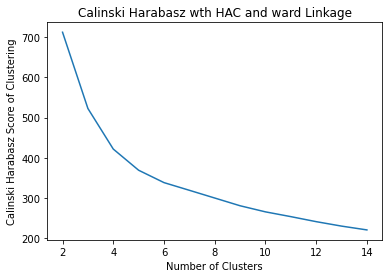

In [209]:
for link in ['ward']:
    avg_ch=[]
    for k in range(2,15):
        #First, designate the HAC linkage function, and the number of clusters you want to extract from the resulting dendrogram
        hac = AgglomerativeClustering(n_clusters=k, affinity='euclidean', linkage=link)
        Y_pred = hac.fit_predict(df_num_scaled)
        avg_ch.append(calinski_harabasz_score(df_num_scaled, Y_pred))
        
    plt.plot(range(2,15), avg_ch)
    plt.title('Calinski Harabasz wth HAC and %s Linkage'%link)
    plt.xlabel('Number of Clusters')
    plt.ylabel('Calinski Harabasz Score of Clustering')
    plt.show()
    


<font color='blue'>
    
**Interpretation**

We can see that the Silhoutte score for k=4 is pretty high while it is the highest for k=7. But looking at the t-SNE plot for k=7, we see that we get some singleton clusters and some of the clusterings don't agree with the underlying clustering structure. Additionally, the Calinski Harabsz score has a smooth elbow at k=4 and starts dropping after that. **So we would proceed with clustering with k=4**

### 8.2 Applying HAC with Ward's Linkage

In [298]:
hac = AgglomerativeClustering(n_clusters = 4, affinity='euclidean', linkage='ward')
df_label['predicted_cluster_hac_ward'] = hac.fit_predict(df_num_scaled)

### 8.3 HAC with Ward's Linkage Results presentation 

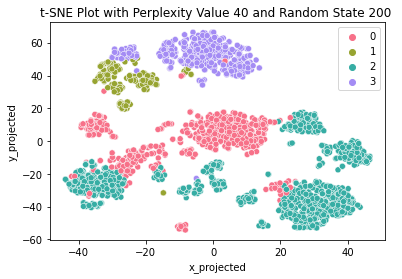

--------------------------------------------


In [217]:
k=len(df_label['predicted_cluster_hac_ward'].unique())
col=df_label['predicted_cluster_hac_ward']
for perp in [ 40]:
      for rs in [ 200]:
          tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
          data_tsne = tsne.fit_transform(df_num_scaled)
          df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
          df_combo = pd.concat([df_stand, df_tsne], axis=1)
          sns.scatterplot(x='x_projected',y='y_projected',hue=col,palette=sns.color_palette("husl", k), data=df_combo)
          plt.title('t-SNE Plot with Perplexity Value %s and Random State %s ' %(perp, rs))
          plt.legend(bbox_to_anchor=(1,1))
          plt.show()
      print('--------------------------------------------')

### 8.4 Assessing Cluster Cohesion and Separation 

**Silhouette Score**

In [299]:
hac_wards_silhouette_avg = silhouette_score(df_num_scaled, df_label['predicted_cluster_hac_ward'])
print("The average silhouette_score is :", hac_wards_silhouette_avg)

The average silhouette_score is : 0.20521812529528072


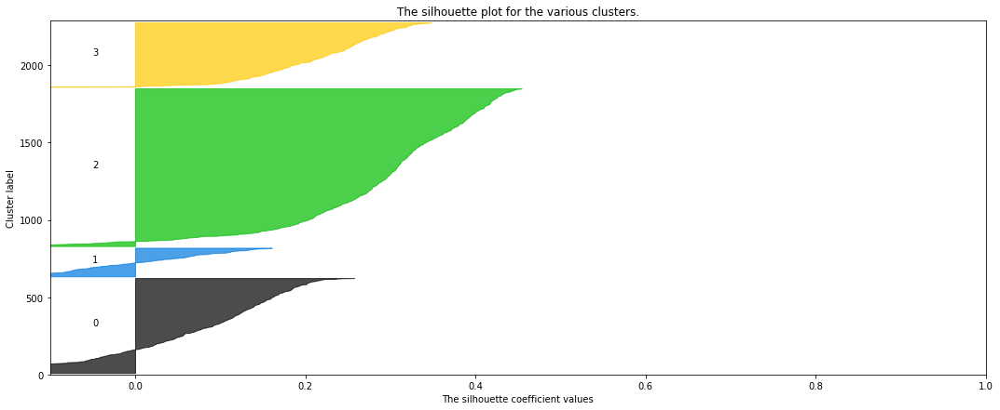

In [221]:
create_silhouette_plot(df_num_scaled, df_label['predicted_cluster_hac_ward'])

<font color='blue'>

**Interpretation** 

The clustering is not perfect as evident from the silhoutte plot above. Cluster 0 and Cluster 1 both have many points with negative silhoutte scores, which suggests that they should belong to another cluster. Cluster 2 seems to be the most cohesive and well separate cluster that has been identified.

**Cluster-Sorted Similarity Matrix**

In [300]:
#Sort the matrix
df_num_scaled['predicted_cluster_hac_ward']=df_label['predicted_cluster_hac_ward']
df_sort=df_num_scaled.sort_values(by='predicted_cluster_hac_ward')

df_num_scaled.drop('predicted_cluster_hac_ward',axis=1,inplace=True)
df_sort.head()

,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,...,Complain,Response,Customer_For,Age,Spent,Children,Family_Size,predicted_cluster_kmeans,predicted_cluster_gmm,predicted_cluster_hac_ward
1119,-0.227961,-0.824769,0.906491,1.687973,0.605969,-0.384881,-0.478598,-0.266151,-0.534794,-0.288253,...,-0.097304,-0.418722,-0.645863,-0.767587,0.048093,0.065942,0.446668,0,1,0
1716,0.387550,-0.824769,0.906491,0.997298,0.641626,-0.158595,0.886085,0.026753,1.306433,-0.077376,...,-0.097304,-0.418722,0.228359,1.068375,0.765535,0.065942,-0.655966,0,1,0
648,1.248938,-0.824769,0.906491,-0.245916,1.238881,-0.661454,-0.066535,1.491272,0.555406,0.114330,...,-0.097304,-0.418722,-1.356438,-0.684134,0.807054,0.065942,0.446668,0,1,0
649,0.697799,-0.824769,0.906491,-0.729388,0.032485,-0.560882,-0.465306,0.063366,0.095100,1.954714,...,-0.097304,-0.418722,-0.284116,0.901469,-0.011693,0.065942,0.446668,0,1,0
652,0.723855,-0.824769,0.906491,0.479292,1.345852,1.349982,0.221466,-0.156312,1.282207,-0.633325,...,-0.097304,-0.418722,0.930320,-0.433776,0.943235,0.065942,0.446668,0,1,0


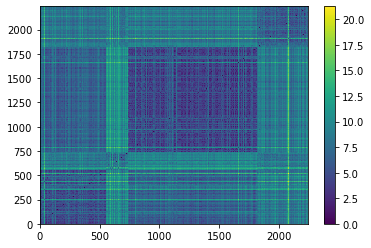

In [301]:
#Create a distance matrix
dist_mat = squareform(pdist(df_sort))
N = len(df_sort)
plt.pcolormesh(dist_mat)
plt.colorbar()
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()

<font color='blue'>

**Interpretation** 

Tallying with the sillhouette plot above we can see that the cluster 2 is the most cohesive and well separated cluster in the dataset while cluster 0 and cluster 3 are moderately cohesive. The least cohesive cluster is cluster 1.

<font color='blue'>

**Correlation between Ideal Sorted Pairwise Distance Matrix and Actual Sorted Pairwise Distance Matrix**

In [302]:
#Find the maximum distance in the distance matrix
min_dist=np.min(dist_mat)
#"Find" the minimum distance in the distance matrix (this will be 0) from the diagonals... ie. the distance between an object and itself is 0.
max_dist=np.max(dist_mat)

#Similarity matrix
sim_mat=1-(dist_mat-min_dist)/(max_dist-min_dist)
sim_mat

array([[1.        , 0.78451792, 0.76102377, ..., 0.56614563, 0.57200214,
        0.56446409],
       [0.78451792, 1.        , 0.79837337, ..., 0.6684343 , 0.63931797,
        0.64907209],
       [0.76102377, 0.79837337, 1.        , ..., 0.63899415, 0.61243673,
        0.59903627],
       ...,
       [0.56614563, 0.6684343 , 0.63899415, ..., 1.        , 0.70993398,
        0.70699884],
       [0.57200214, 0.63931797, 0.61243673, ..., 0.70993398, 1.        ,
        0.62465472],
       [0.56446409, 0.64907209, 0.59903627, ..., 0.70699884, 0.62465472,
        1.        ]])

In [303]:
from scipy.linalg import block_diag

#Count the number of objects in each cluster, and sort by cluster label
cluster_sizes=df_label['predicted_cluster_hac_ward'].value_counts().sort_index()
print(cluster_sizes)

#Create a list of 1-by-1 square matrices, each matrix is the size of a cluster
block_list=[]
for i in cluster_sizes:
    print(i)
    block_list.append(np.ones((i,i)).tolist())

#Put these 1-by-1 square matrices on the block diagonal of an otherwise 0-matrix
#Then do 1-(this matrix)
ideal_sim_mat=block_diag(block_list[0], block_list[1], block_list[2],block_list[3]
                        # ,block_list[4], block_list[5], block_list[6]
                        )
ideal_sim_mat

0     557
1     187
2    1078
3     417
Name: predicted_cluster_hac_ward, dtype: int64
557
187
1078
417


array([[1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.]])

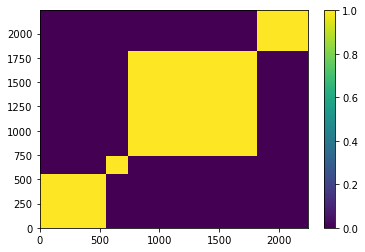

In [304]:
#Create a distance matrix
plt.pcolormesh(ideal_sim_mat)
plt.colorbar()
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()

In [305]:
flat_sim_mat=sim_mat[0]
for i in sim_mat[1:len(sim_mat)]:
    flat_sim_mat+=i

flat_ideal_sim_mat=ideal_sim_mat[0]
for i in ideal_sim_mat[1:len(ideal_sim_mat)]:
    flat_ideal_sim_mat+=i

hac_corr=np.corrcoef(flat_sim_mat,flat_ideal_sim_mat)

np.corrcoef(flat_sim_mat,flat_ideal_sim_mat)

array([[1.        , 0.65217904],
       [0.65217904, 1.        ]])

<font color='blue'> 
    
The correlation between Ideal pairwise distance matrix and Actual Pairwise distance matrix is 0.65 which is on the higher side. Its slightly better than the one we obtained for k-means.

<font color='blue'>
    
**Calinski Harabasz Score**

In [306]:
hac_calinski=calinski_harabasz_score(df_num_scaled, df_label['predicted_cluster_hac_ward'])
calinski_harabasz_score(df_num_scaled, df_label['predicted_cluster_hac_ward'])

427.9590283488986

<font color='blue'>
    
**Interpretation** 

The Calinski Harabasz score is slightly lower than what we obtain in K-means suggesting a less cohesive and more separated clustering. 

### 8.5 Describing Each of the Clusters 

<font color='blue'>
    
**For Numerical Attributes**

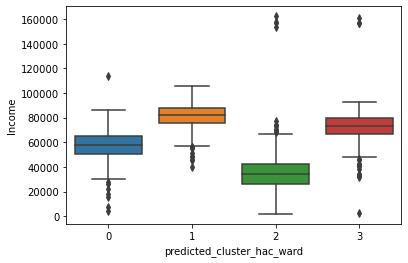

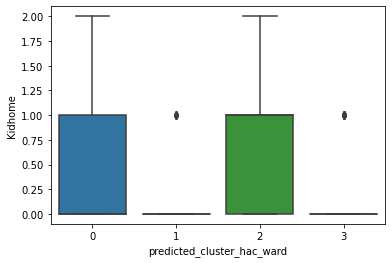

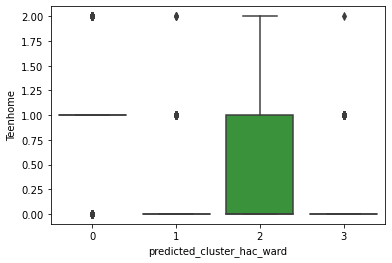

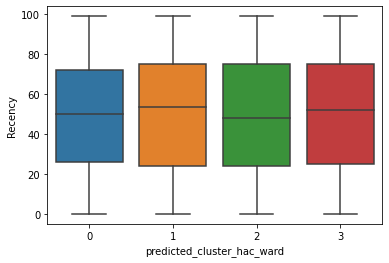

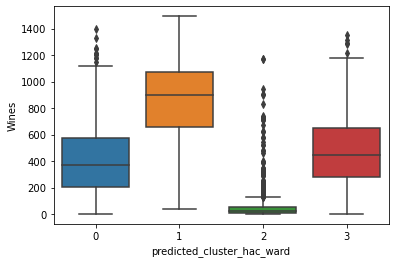

...

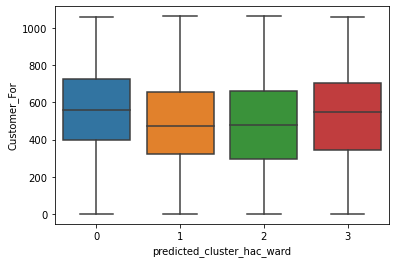

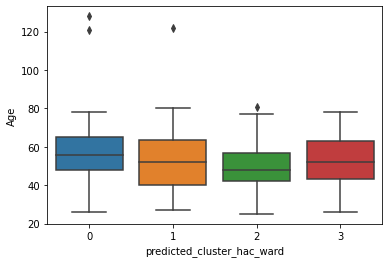

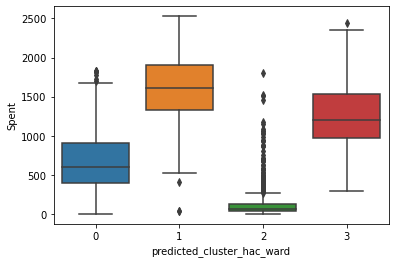

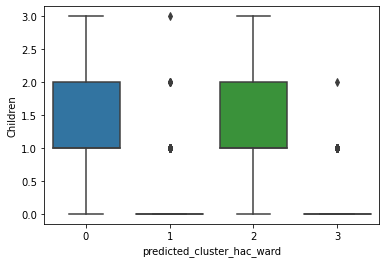

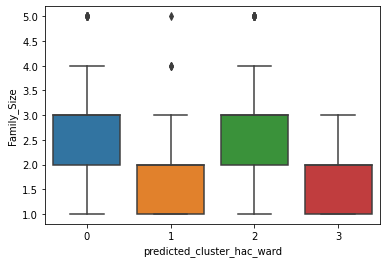

In [226]:
for col in ['Income', 'Kidhome', 'Teenhome', 'Recency', 'Wines', 'Fruits', 'Meat','Fish', 'Sweets', 'Gold', 'NumDealsPurchases', 'NumWebPurchases','NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth','Customer_For', 'Age', 'Spent', 'Children', 'Family_Size']:
    sns.boxplot(x=df_label['predicted_cluster_hac_ward'], y=col, data=df)
    plt.show()

<font color='blue'>

**Categorical and Promotional Variables**

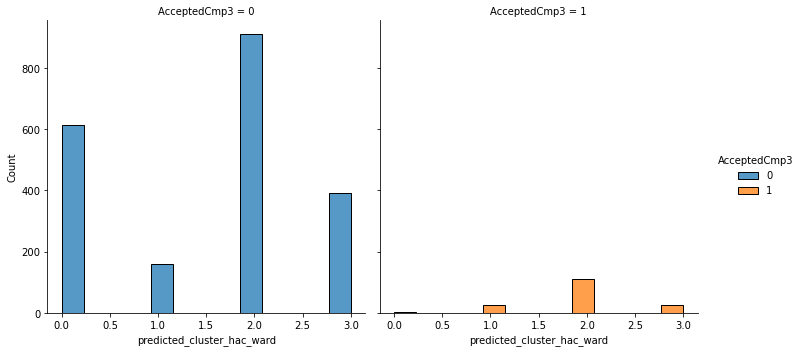

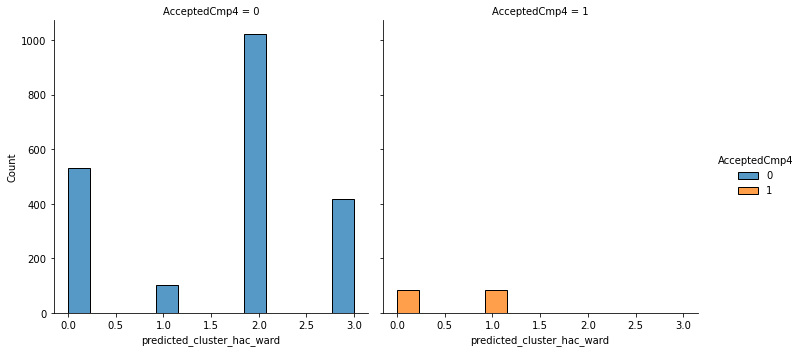

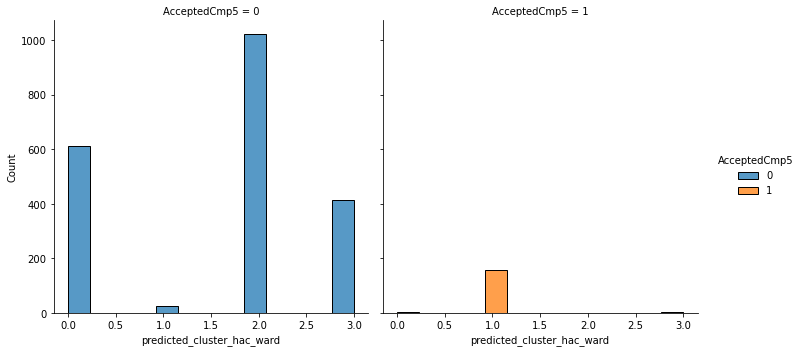

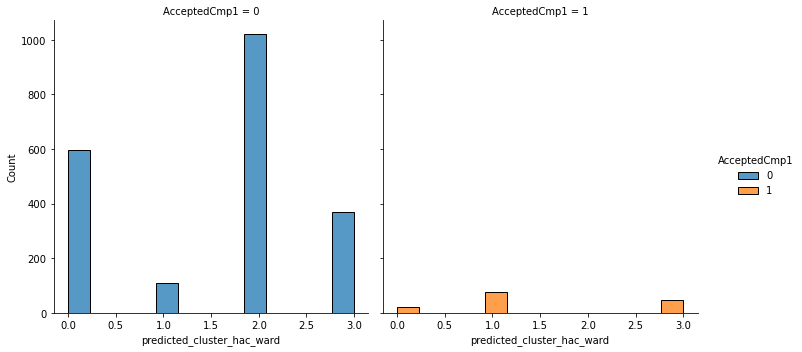

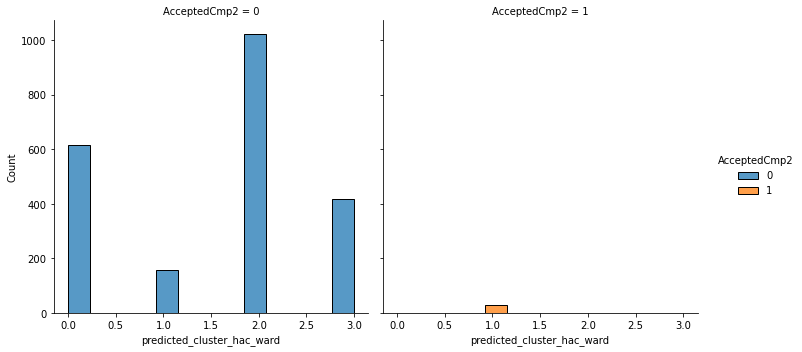

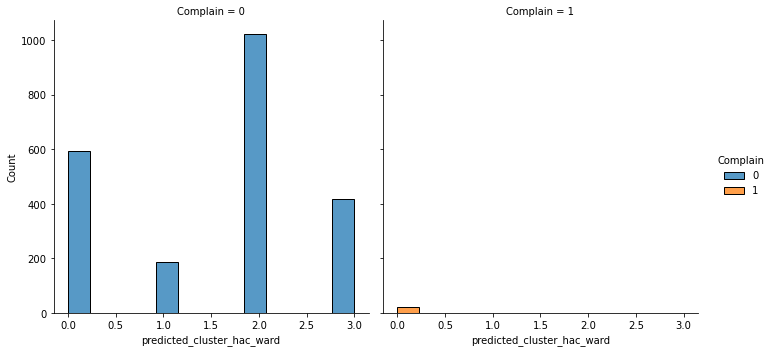

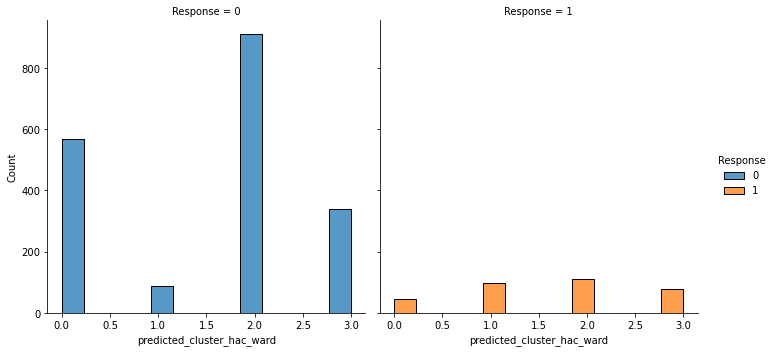

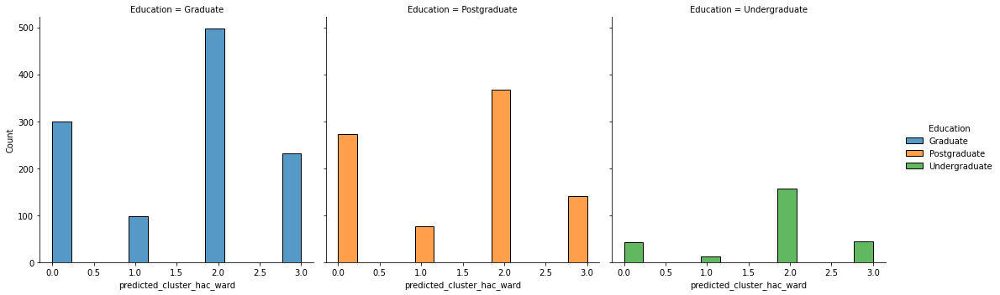

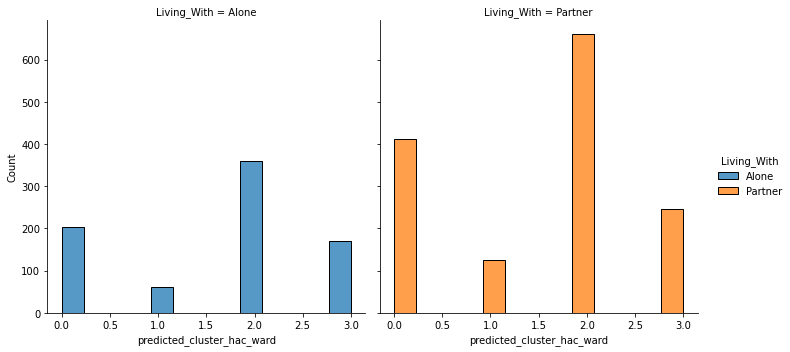

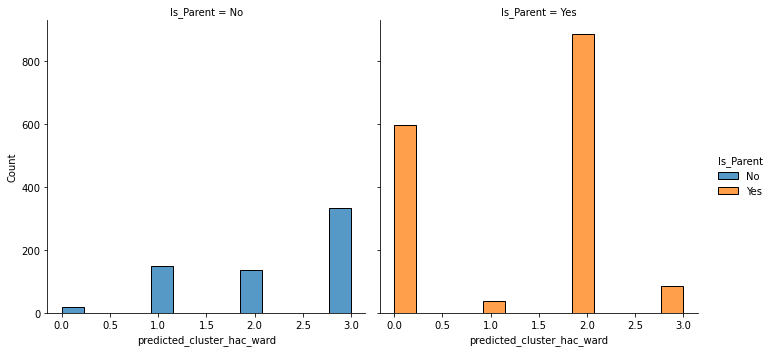

In [266]:
for col in [ 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1','AcceptedCmp2', 'Complain', 'Response','Education', 'Living_With', 'Is_Parent']:
    sns.displot(x=df_label['predicted_cluster_hac_ward'], hue=col, col=col,data=df)
    plt.show()

<font color='blue'> 
    
**Relationship between Income and Amount Spent on Purchases**

<AxesSubplot:xlabel='Income', ylabel='Spent'>

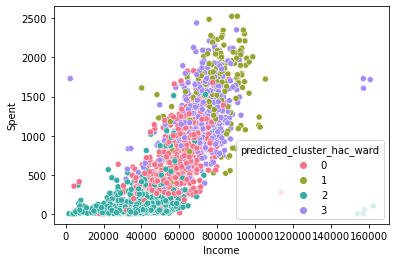

In [274]:
sns.scatterplot(x=df['Income'],y=df['Spent'],hue=df_label['predicted_cluster_hac_ward'],palette=sns.color_palette("husl", 4))

<AxesSubplot:xlabel='Spent', ylabel='Is_Parent'>

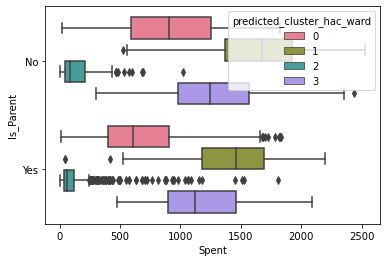

In [279]:
sns.boxplot(x=df['Spent'],y=df['Is_Parent'],hue=df_label['predicted_cluster_hac_ward'],palette=sns.color_palette("husl", 4))



<font color='blue'>

**Insights**

`Cluster 0`

* **Customer Demographic Profile** - Customers have moderately high income,mostly graduates and post-graduates and are currently living with family with children.Their average age is towards the higher side indicating that the customers are mostly senior citizens.
* **Spend Behaviour**- They spend lesser than other customers on fruits,fish and sweets and overall they  spend less on products as compared to other customers.
* **Response to Deals and Promotions**-They have highest purchases through deals and promotions and have responded well to marketing campaign 4. 
* **Channel of Purchase** - Most of their purchases are in-store with decnt number of web visits.

`Cluster 1`

* **Customer Demographic Profile** - Highest Income Group as well as the highest spend group. Mostly middle aged living with a partner and have no children. 
* **Spend Behaviour**- Highest amount of purchases on Wine and Gold and highest spend overall. 
* **Response to Deals and Promotions** - Don't usually purchase using deals, but respond very well to campaign 1 , campaign 5 and the latest campaign. 
* **Channel of Purchase** - They are usually in-Store customers with lower web visits.

`Cluster 2`

* **Customer Demographic Profile** - Lowest Income Group among all the customers.They are mostly young and live with family.Most of them hold a graduate or post graduate degree.
* **Spend Behaviour** - Low spending behaviour across all products
* **Response to Deals and Promotions** - Purchase mostly through deals and promotions. They had a good response to Campaign 3.
* **Channel of Purchase** - Although their visits to the website is high, most of their purchases are in-store.

`Cluster 3`

* **Customer Demographic Profile** - They mostly belong to the moderately high income group. Somewhat senior in age and mostly live alone without a partner or children.
* **Spend Behaviour**- Spend mostly on grocery items like fish,meat and sweets.
* **Response to Deals and Promotions**- They don't usually purchase through deals or promotions. Their response to the latest campaign was very good.
* **Channel of Purchase**- Purchase through all channels ; Store , Catalog and Ecommerce



## 9.Gaussian Mixture Models - Clustering the dataset and Post-Cluster Analysis

### 9.1 Parameter Selection

<font color='blue'>  

To select the parameters for Gaussian Mixture Models, we need to iterate through multiple number of clusters and assess which cluster number has the minimum AIC/BIC and has the maximum log likelihood.

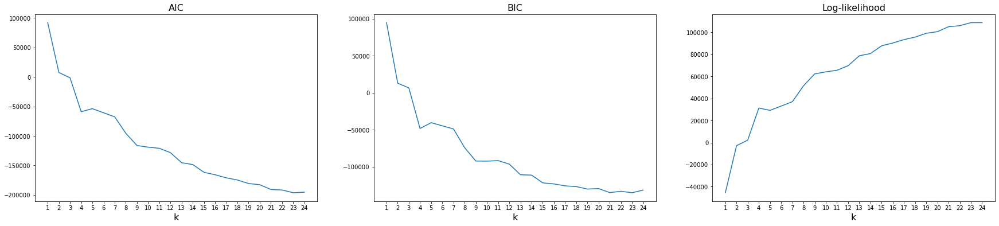

In [228]:
aics = []
bics = []
log_likelihoods = []

for k in range(1, 25):
    #Fit the GMM model
    gm = GaussianMixture(n_components=k, random_state=100)
    gm.fit(df_num_scaled)
    
    #Calculate the AIC, BIC, and log-likelihood for this model
    aics.append(gm.aic(df_num_scaled))
    bics.append(gm.bic(df_num_scaled))
    log_likelihoods.append(gm.score(df_num_scaled) * len(df_num_scaled))


#Plot these values
fig, ax = plt.subplots(1, 3, figsize=(30, 6))

#AIC
ax[0].plot(range(1, 25), aics)
ax[0].set_xticks(range(1, 25))
ax[0].set_xlabel('k', fontsize=16)
ax[0].set_title('AIC', fontsize=16)

#BIC
ax[1].plot(range(1, 25), bics)
ax[1].set_xticks(range(1, 25))
ax[1].set_xlabel('k', fontsize=16)
ax[1].set_title('BIC', fontsize=16)

#Log-likelihood
ax[2].plot(range(1, 25), log_likelihoods)
ax[2].set_xticks(range(1, 25))
ax[2].set_xlabel('k', fontsize=16)
ax[2].set_title('Log-likelihood', fontsize=16)

plt.show()

<font color='blue'>  

**Interpretation** 

We observe a sharp local minima for AIC and BIC at k=4 and a small spike ( or local maxima) for Log-Likelihood at k=4. So we would proceed with clustering the dataset with k=4 clusters

### 9.2 Applying GMM

In [251]:
gmm=GaussianMixture(n_components=4, covariance_type='spherical',max_iter=2000, random_state=5).fit(df_num_scaled)
df_label['predicted_cluster_gmm']=gmm.predict(df_num_scaled)

### 9.3 GMM Results presentation 

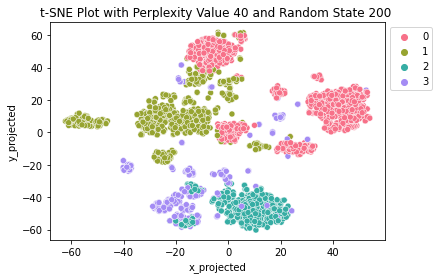

--------------------------------------------


In [252]:
k=len(df_label['predicted_cluster_gmm'].unique())
col=df_label['predicted_cluster_gmm']
for perp in [ 40]:
      for rs in [ 200]:
          tsne = TSNE(n_components=2, perplexity=perp, random_state=rs)
          data_tsne = tsne.fit_transform(df_num_scaled)
          df_tsne = pd.DataFrame(data_tsne, columns=['x_projected', 'y_projected'])
          df_combo = pd.concat([df_stand, df_tsne], axis=1)
          sns.scatterplot(x='x_projected',y='y_projected',hue=col,palette=sns.color_palette("husl", k), data=df_combo)
          plt.title('t-SNE Plot with Perplexity Value %s and Random State %s ' %(perp, rs))
          plt.legend(bbox_to_anchor=(1,1))
          plt.show()
      print('--------------------------------------------')

<font color='blue'>  

**Interpretation** 

We observe that GMM is not able to completely identify the underlying clustering structure of the dataset. In fact, the clustering seems to be worse off than HAC with Ward's linkage and K-means.

### 9.4 Assessing Cluster Cohesion and Separation 

<font color='blue'>  
    
**Silhouette Score**

In [253]:
gmm_silhouette_avg = silhouette_score(df_num_scaled, df_label['predicted_cluster_gmm'])
print("The average silhouette_score is :", gmm_silhouette_avg)

The average silhouette_score is : 0.1897459531424706


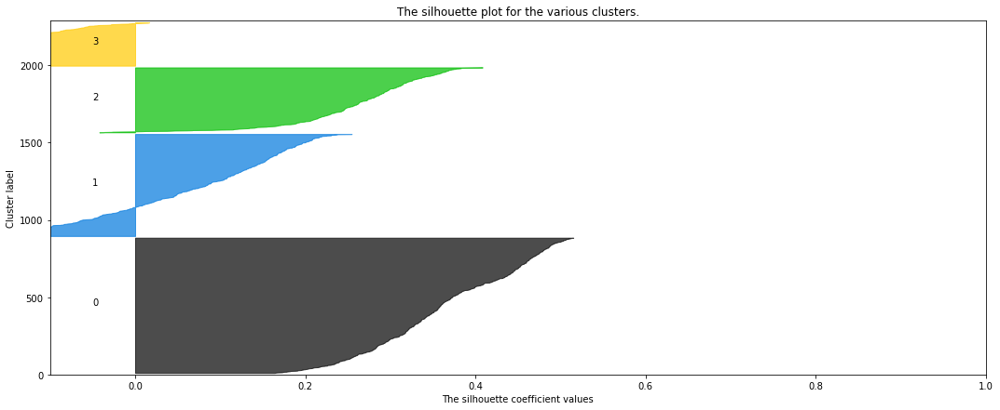

In [254]:
create_silhouette_plot(df_num_scaled, df_label['predicted_cluster_gmm'])

<font color='blue'>  

**Interpretation** 

As expected, the Silhoutte score is lower than HAC and K-means. Cluster 3 seems to be the least cohesive cluster. 

**Cluster-Sorted Similarity Matrix**

In [292]:
#Sort the matrix
df_num_scaled['predicted_cluster_gmm']=df_label['predicted_cluster_gmm']
df_sort=df_num_scaled.sort_values(by='predicted_cluster_gmm')
df_sort.drop(['predicted_cluster_gmm'], axis=1)
df_num_scaled.drop(['predicted_cluster_gmm'], axis=1)
df_sort.head()


,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,...,AcceptedCmp2,Complain,Response,Customer_For,Age,Spent,Children,Family_Size,predicted_cluster_kmeans,predicted_cluster_gmm
593,-0.873397,1.033035,-0.930282,-1.385529,-0.867854,-0.510596,-0.731153,-0.485829,-0.607474,-0.537472,...,-0.116537,-0.097304,-0.418722,-0.869802,-0.684134,-0.925103,0.065942,0.446668,1,0
1614,-0.958464,1.033035,0.906491,-0.867523,-0.873797,-0.661454,-0.695707,-0.632281,-0.631700,-0.710008,...,-0.116537,-0.097304,2.388220,-0.731994,-0.684134,-0.954996,1.396080,1.549302,1,0
1613,-0.837179,1.033035,-0.930282,1.480771,-0.606370,-0.611168,-0.172874,-0.266151,-0.486340,-0.652496,...,-0.116537,-0.097304,-0.418722,-0.249664,-0.517229,-0.558078,0.065942,-0.655966,1,0
710,-1.242843,1.033035,-0.930282,-0.798456,-0.900540,-0.586025,-0.722292,-0.650588,-0.607474,-0.729179,...,-0.116537,-0.097304,-0.418722,-0.637250,-1.435210,-0.976586,0.065942,0.446668,1,0
1611,-1.842226,-0.824769,-0.930282,-0.384051,-0.888654,-0.510596,-0.673553,-0.485829,-0.486340,-0.594984,...,-0.116537,-0.097304,-0.418722,1.963883,-0.767587,-0.911817,-1.264195,-0.655966,1,0


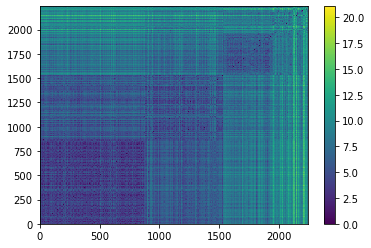

In [293]:
#Create a distance matrix
dist_mat = squareform(pdist(df_sort))
N = len(df_sort)
plt.pcolormesh(dist_mat)
plt.colorbar()
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()


<font color='blue'>  

**Interpretation** 

Cluster 0 and Cluster 2 are the most cohesive and well separated from each other while cluster 1 and cluster 4 are not cohesive at all and less separated from other clusters.

**Correlation between Ideal Sorted Pairwise Distance Matrix and Actual Sorted Pairwise Distance Matrix**

In [294]:
#Find the maximum distance in the distance matrix
min_dist=np.min(dist_mat)
#"Find" the minimum distance in the distance matrix (this will be 0) from the diagonals... ie. the distance between an object and itself is 0.
max_dist=np.max(dist_mat)

#Similarity matrix
sim_mat=1-(dist_mat-min_dist)/(max_dist-min_dist)
sim_mat


array([[1.        , 0.79953541, 0.79764741, ..., 0.53889817, 0.45131407,
        0.58127492],
       [0.79953541, 1.        , 0.7471218 , ..., 0.53083933, 0.4283588 ,
        0.60981857],
       [0.79764741, 0.7471218 , 1.        , ..., 0.56669936, 0.46703814,
        0.62821556],
       ...,
       [0.53889817, 0.53083933, 0.56669936, ..., 1.        , 0.62108351,
        0.6493264 ],
       [0.45131407, 0.4283588 , 0.46703814, ..., 0.62108351, 1.        ,
        0.59037257],
       [0.58127492, 0.60981857, 0.62821556, ..., 0.6493264 , 0.59037257,
        1.        ]])

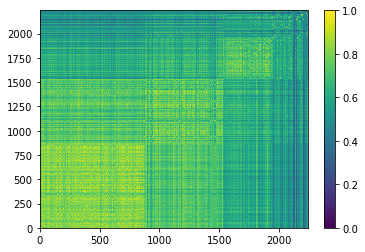

In [295]:
#Create a distance matrix
plt.pcolormesh(sim_mat)
plt.colorbar()
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()


In [296]:
from scipy.linalg import block_diag

#Count the number of objects in each cluster, and sort by cluster label
cluster_sizes=df_label['predicted_cluster_kmeans'].value_counts().sort_index()
print(cluster_sizes)

#Create a list of 1-by-1 square matrices, each matrix is the size of a cluster
block_list=[]
for i in cluster_sizes:
    print(i)
    block_list.append(np.ones((i,i)).tolist())

#Put these 1-by-1 square matrices on the block diagonal of an otherwise 0-matrix
#Then do 1-(this matrix)
ideal_sim_mat=block_diag(block_list[0], block_list[1], block_list[2],block_list[3])
ideal_sim_mat

0     587
1    1053
2     169
3     430
Name: predicted_cluster_kmeans, dtype: int64
587
1053
169
430


array([[1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.]])

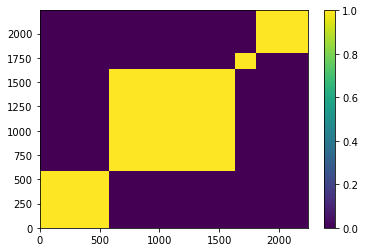

array([[1.        , 0.41742382],
       [0.41742382, 1.        ]])

In [297]:
#Create a distance matrix
plt.pcolormesh(ideal_sim_mat)
plt.colorbar()
plt.xlim([0,N])
plt.ylim([0,N])
plt.show()


flat_sim_mat=sim_mat[0]
for i in sim_mat[1:len(sim_mat)]:
    flat_sim_mat+=i

flat_ideal_sim_mat=ideal_sim_mat[0]
for i in ideal_sim_mat[1:len(ideal_sim_mat)]:
    flat_ideal_sim_mat+=i

gmm_corr=np.corrcoef(flat_sim_mat,flat_ideal_sim_mat)

np.corrcoef(flat_sim_mat,flat_ideal_sim_mat)

**Calinski Harabasz Score**

In [286]:
gmm_calinski=calinski_harabasz_score(df_num_scaled, df_label['predicted_cluster_gmm'])
calinski_harabasz_score(df_num_scaled, df_label['predicted_cluster_gmm'])



379.17001628424407

<font color='blue'>  

**Interpretation** 

The correlation between the cluster sorted similarity matrices are quiet low; at least lower than the other clustering algorithms implemented so far.  The Calinski Harabasz score is also lower than the other 2 algorithms. This implies that the clustering algorithm was not able to detect the underlying clustering structure of the dataset.

### 9.5 Describing Each of the Clusters 

**For Numerical Variables**

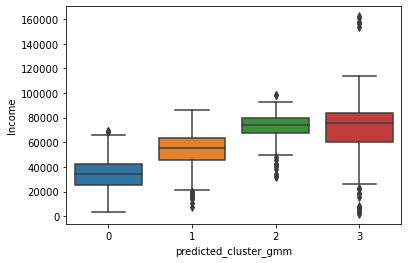

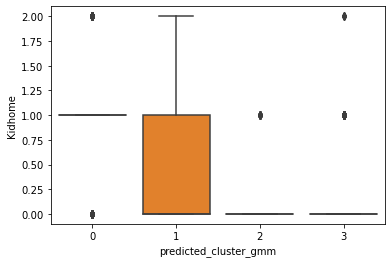

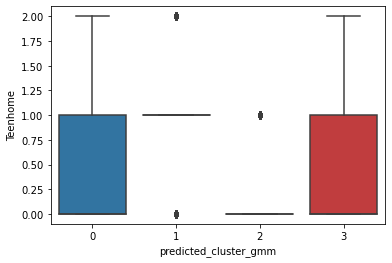

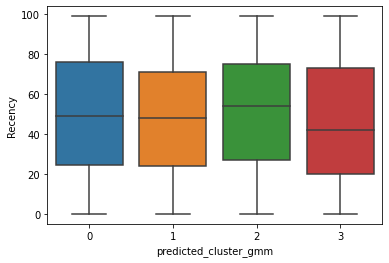

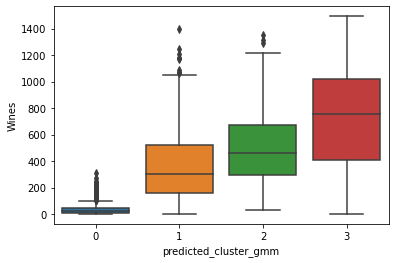

...

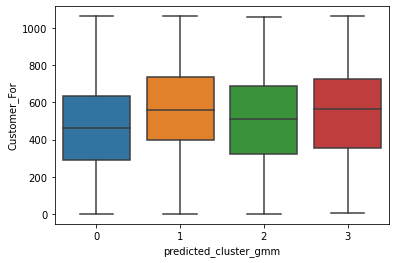

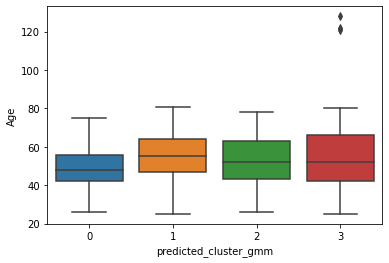

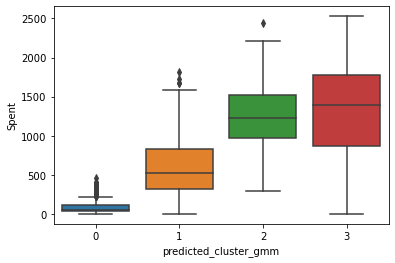

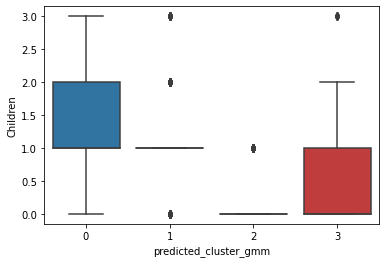

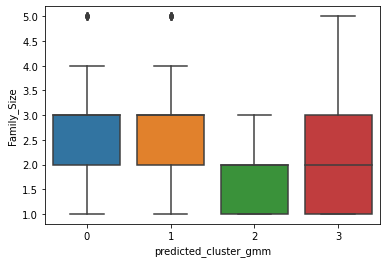

In [262]:
for col in ['Income', 'Kidhome', 'Teenhome', 'Recency', 'Wines', 'Fruits', 'Meat','Fish', 'Sweets', 'Gold', 'NumDealsPurchases', 'NumWebPurchases','NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth','Customer_For', 'Age', 'Spent', 'Children', 'Family_Size']:
    sns.boxplot(x=df_label['predicted_cluster_gmm'], y=col, data=df)
    plt.show()

**For Categorical and Promotional Variables**

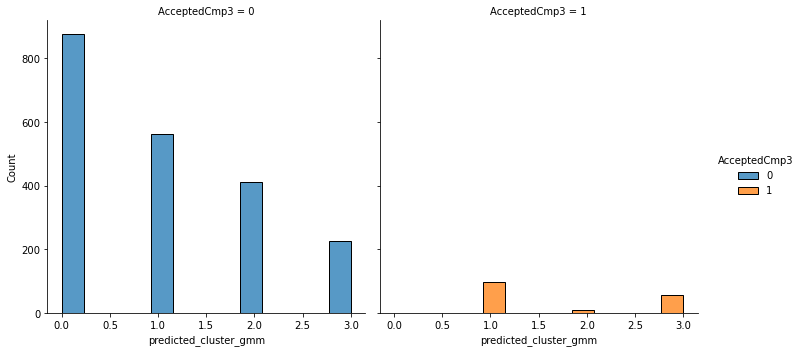

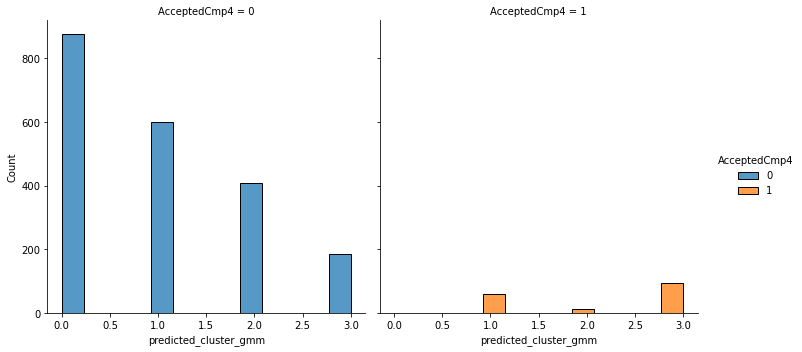

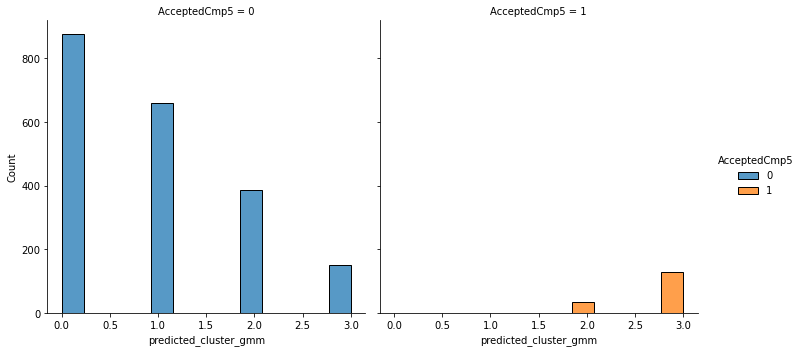

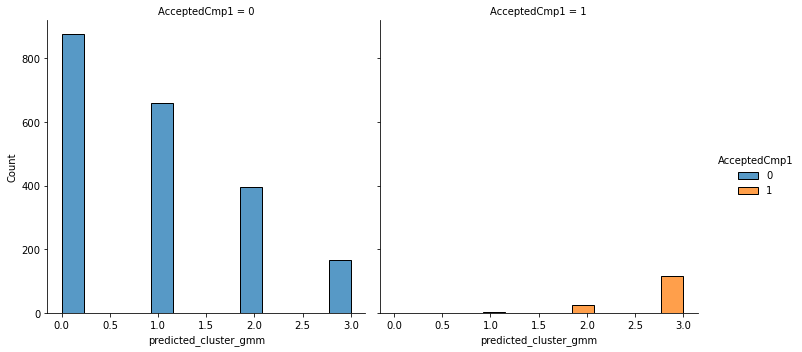

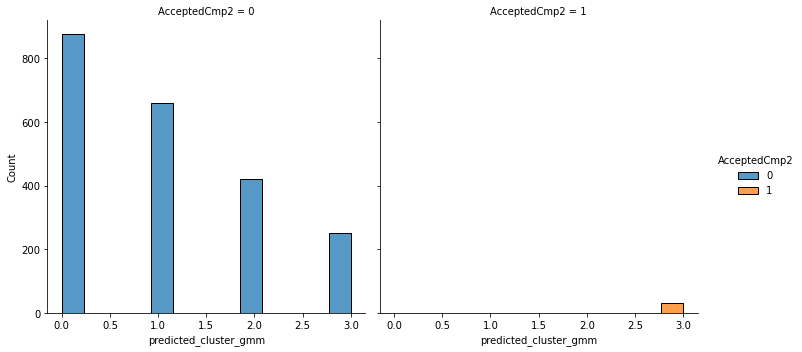

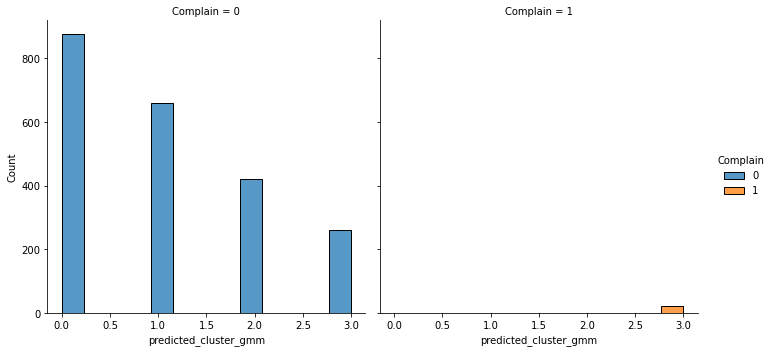

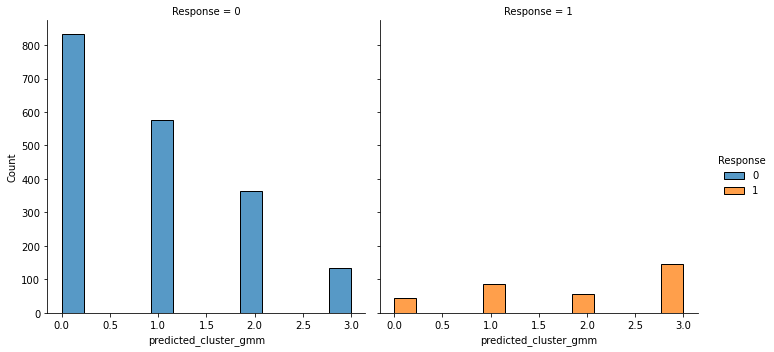

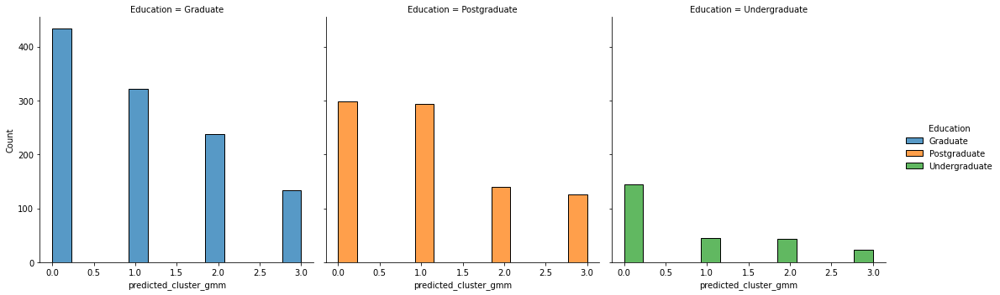

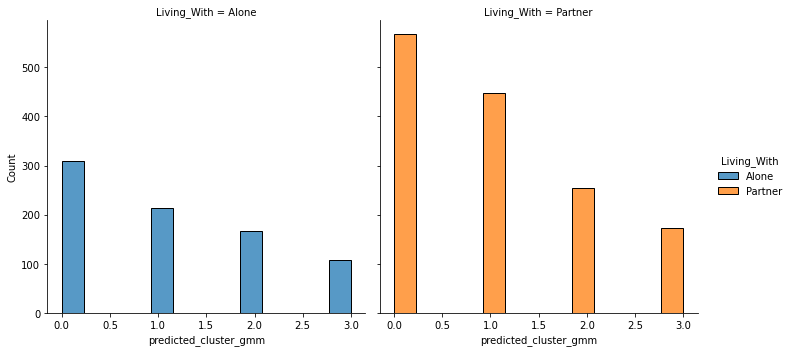

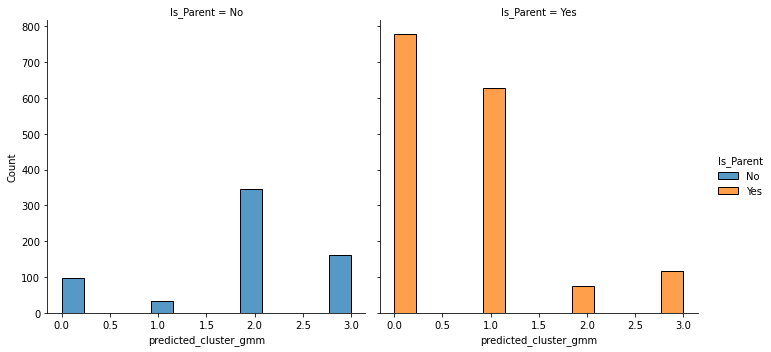

In [263]:
for col in [ 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1','AcceptedCmp2', 'Complain', 'Response','Education', 'Living_With', 'Is_Parent']:
    sns.displot(x=df_label['predicted_cluster_gmm'], hue=col, col=col,data=df)
    plt.show()



<font color='blue'>

**Insights**

`Cluster 0`

* **Customer Demographic Profile** - Customers have moderately high income,mostly graduates and post-graduates and are currently living with family with children.Their average age is towards the higher side indicating that the customers are mostly senior citizens.
* **Spend Behaviour**- They spend lesser than other customers on fruits,fish and sweets and overall they  spend less on products as compared to other customers.
* **Response to Deals and Promotions**-They have highest purchases through deals and promotions and have responded well to marketing campaign 4. 
* **Channel of Purchase** - Most of their purchases are in-store with decnt number of web visits.

`Cluster 1`

* **Customer Demographic Profile** - Highest Income Group as well as the highest spend group. Mostly middle aged living with a partner and have no children. 
* **Spend Behaviour**- Highest amount of purchases on Wine and Gold and highest spend overall. 
* **Response to Deals and Promotions** - Don't usually purchase using deals, but respond very well to campaign 1 , campaign 5 and the latest campaign. 
* **Channel of Purchase** - They are usually in-Store customers with lower web visits.

`Cluster 2`

* **Customer Demographic Profile** - Lowest Income Group among all the customers.They are mostly young and live with family.Most of them hold a graduate or post graduate degree.
* **Spend Behaviour** - Low spending behaviour across all products
* **Response to Deals and Promotions** - Purchase mostly through deals and promotions. They had a good response to Campaign 3.
* **Channel of Purchase** - Although their visits to the website is high, most of their purchases are in-store.

`Cluster 3`

* **Customer Demographic Profile** - They mostly belong to the moderately high income group. Somewhat senior in age and mostly live alone without a partner or children.
* **Spend Behaviour**- Spend mostly on grocery items like fish,meat and sweets.
* **Response to Deals and Promotions**- They don't usually purchase through deals or promotions. Their response to the latest campaign was very good.
* **Channel of Purchase**- Purchase through all channels ; Store , Catalog and Ecommerce



## 10. Analysis Summary and Conclusion

### 10.1 Algorithm Comparison Summary


<font color='blue'>
    
**Algorithm Performance**

<font color='blue'>

Let's compare the 3 algorithms with respect to the cohesion and separation . We have used the followin metrics to judge the cohesion and separation : 

* Silhouette Score
* Correlation Between the sorted pairwise ideal distance matrix and actual matrix 
* Calinski Harabasz Score. 

Based on the above 3 let's plot the metrics for all three clustering algorithms.

In [326]:
algo_list=['k_means','hac_wards','gmm']

sil_list = [k_means_silhouette_avg,hac_wards_silhouette_avg,gmm_silhouette_avg]

corr_list=[kmeans_corr[1][0],hac_corr[1][0],gmm_corr[1][0]]

calinski_list=[kmeans_calinski,hac_calinski,gmm_calinski]

Text(0, 0.5, 'Average Silhouette Score')

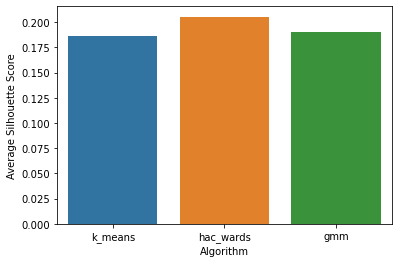

In [333]:
p = sns.barplot(x=algo_list,y=sil_list)
p.set_xlabel("Algorithm", fontsize = 10)
p.set_ylabel("Average Silhouette Score", fontsize = 10)


Text(0, 0.5, 'Correlation between Ideal Pairwise Sorted and Actual Pairwise Sorted Matrices')

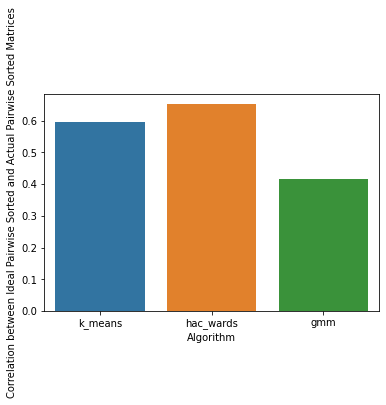

In [335]:
p = sns.barplot(algo_list,corr_list)
p.set_xlabel("Algorithm", fontsize = 10)
p.set_ylabel("Correlation between Ideal Pairwise Sorted and Actual Pairwise Sorted Matrices", fontsize = 10)



<AxesSubplot:xlabel='Algorithm', ylabel='Calinski-Harabasz Score'>

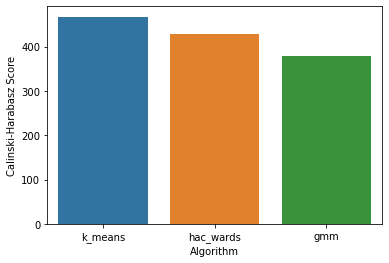

In [337]:
p = sns.barplot(algo_list,calinski_list)
p.set_xlabel("Algorithm", fontsize = 10)
p.set_ylabel("Calinski-Harabasz Score", fontsize = 10)


sns.barplot(algo_list,calinski_list)

<font color='blue'>

**Interpretation** 

We can observe that HAC with Ward's Linkage performs well wrt Silhouette Score and Correlation between matrices. Additionally,the Calinski Harabasz Score is not far behind k-means. So we would utilise the clusterings from HAC with Ward's linkage as it will produce the most cohesive and well separated clusters among the 3 algos. 

<font color='blue'>

**Algorithm Results**

<font color='blue'>

After analysing the various features that characterise each cluster for each algorithm, we have come to the conclusion that there 4 broad categories of customers based on their spending behaviour,channel of purchase , response to marketing campaigns and deals and demographics. These can be categorised as :

* **Stars** - The high spending customers who expensive purchasing patterns like gold and wine. 
* **High Potential** - Customers who have high spending habits and have specific spending patterns like groceries.
* **Need Attention** - Customers with moderately high income and who respond well to deals and promotions. 
* **Leaky Bucket**- Customers with lowest income among all who don't usually respond to promotional campaigns and also spend less on products

<font color='blue'>

Additionally, let us analyse how well our clusterings are agreeing with each other through adjusted rand score.

<font color='blue'>

**Kmeans vs HAC Wards' Linkage**

In [338]:
adjusted_rand_score(df_label['predicted_cluster_kmeans'],df_label['predicted_cluster_hac_ward'])

0.8219532130255819

<font color='blue'>

**HAC Wards' Linkage vs GMM**

In [339]:
adjusted_rand_score(df_label['predicted_cluster_gmm**Kmeans vs HAC Wards' Linkage**'],df_label['predicted_cluster_hac_ward'])

0.6567443472078245

<font color='blue'>

**Kmeans vs GMM**

In [340]:
adjusted_rand_score(df_label['predicted_cluster_kmeans'],df_label['predicted_cluster_gmm'])

0.6980621627362397

<font color='blue'>

Essentially, the clusterings with K Means algorithm and HAC with Ward's linkage agree with each other the most. GMM clustering doesn't agree with the other two as much. Since we already established that HAC with Ward's linkage performs adequately in clustering the dataset, we will go ahead in summarising the insights using this clustering alone.

## 10.2 Conclusion and Insights Summary

<font color='blue'>

As a conclusion, based on the categories described above we can obtain the following insights from the different customer segments : 

* **Star Customers** : These customers spend more on expensive items like gold and wine. Additionally they respond to campaign 1 and 5 as well the latest campaign. They are mostly without children and live with their partners. They mostly purchase in-store and don't have enough web visits. 

**Our Recommendation** - Use targetted campaigns for retaining these customers ( as they are the most valuable customers) for the retailer. Since they have somewhat lower web visits, we can have digital ad placements that would enable more redirections to the landing page of the retail site. Loyalty discounts and free gifts can also be utilised to encourage retention.

* **High Potential** : Although these customers spend more than others, they have specific spending habits like fish, meat and sweets. They are of the higher age group and purchase through all channels store,catalog and ecommerce. 

 **Our Recommendation** - Use targetted marketing campaigns marketing for groceries. Since these are people who are most likely senior citizens, utilise marketing campaigns to offer free home delivery of groceries. Additionally introduce attractive subscription model for these customers so that they retained. The latest campaign can also be fine tuned and rolled out to these customers as their response rate was pretty good for the campaign.

* **Need Attention** : These customers have moderately high income and respond well to promotional campaigns and deal offers. However their spend is low on most of the products offered by the retailer. They have responded well to the latest campaign and marketing campaign 4. They have lower web vistis as well. Lower spend on groceries.

**Our Recommendation** - The marketing campaigns can be optimised with deals and promotions to ensure these customers are retained. Their purchase behaviour can be understood further and broken down into various sub-categories. Additionally they can be offered free trial subscription of groceries in order to increase their purchases in that category. Marketing Campaign 4 can be fine tuned and rolled out to these customers for a better response. 

* **Leaky Bucket** : These are the lowest income and the lowest spending customers. Most of their purchases are in-store while they have high web visits. This might be because they visit the web to check prices and obtain the products at discounted prices during clearance sales.

**Our Recommendation** : These customers can have marketing emails targetted during clearance sale weeks and special occassions like black friday. Since they don't add a significant amount of value to the revenue stream, the marketing budget allocated to the retailers' marketing team could be redirected to the other segments for better utilisation.


##  11. Group Contribution Report